# IEEE-CIS Fraud Detection
## https://www.kaggle.com/competitions/ieee-fraud-detection/overview, Kaggle, 2019

## EDA
- Начнем с загрузки данных. 
- Обрабатываем все признаки, кроме V-, по следующему принципу - строим распределения, считаем пропуски и общую информацию по признаку. 
- Оставшиеся признаки V - разбиваем на группы по 20 признаков, считаем матрицу корреляций между ними, по общему количеству пропусков и по корреляции составляем пары (подгруппы) для отбора и отбираем признаки из пар (подгрупп).

**Итого на выходе ноутбука**: получаем первичный набор признаков с уже частично обработанными V- признаками.

In [1]:
# блок импортов
import cudf as cd
import cupy as cp
import matplotlib.pyplot as plt
import seaborn as sns
import gc
import numpy as np
import pandas as pd

In [2]:
cols_t = ['TransactionID', 'TransactionDT', 'TransactionAmt',
       'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6',
       'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain',
       'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11',
       'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8',
       'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4',
       'M5', 'M6', 'M7', 'M8', 'M9']
cols_v = ['V'+str(x) for x in range(1,340)]; types_v = {}
for c in cols_v: types_v[c] = 'float32' # конвертируем для экономии памяти

df_trans = cd.read_csv(r'../data/raw/train_transaction.csv', usecols=cols_t+['isFraud']+cols_v, dtype=types_v)
df_ident = cd.read_csv(r'../data/raw/train_identity.csv')

#### Разбиение признаков по количеству Nan
- Подсчитаем для каждого признака isna() и сгруппируем признаки с одинаковым количеством пропусков для дальнейшего отбора

In [4]:
nans_df = df_trans.isna()
nans_groups = {}
l = len(df_trans)

for col in df_trans.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups[cur_group].append(col)
    except:
        nans_groups[cur_group] = [col]
        
del nans_df 
gc.collect()

for k, v in nans_groups.items():
    print(f'NaN count = {k}, {np.round(100 * k/l, 2)}% of NaN: {v}\n')

NaN count = 0, 0.0% of NaN: ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']

NaN count = 8933, 1.51% of NaN: ['card2']

NaN count = 1565, 0.27% of NaN: ['card3']

NaN count = 1577, 0.27% of NaN: ['card4']

NaN count = 4259, 0.72% of NaN: ['card5']

NaN count = 1571, 0.27% of NaN: ['card6']

NaN count = 65706, 11.13% of NaN: ['addr1', 'addr2']

NaN count = 352271, 59.65% of NaN: ['dist1']

NaN count = 552913, 93.63% of NaN: ['dist2']

NaN count = 94456, 15.99% of NaN: ['P_emaildomain']

NaN count = 453249, 76.75% of NaN: ['R_emaildomain']

NaN count = 1269, 0.21% of NaN: ['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']

NaN count = 280797, 47.55% of NaN: ['D2']

NaN count = 262878, 44.51% of NaN: ['D3']

NaN count = 168922, 28.6% of NaN: ['D4']

NaN count = 309841, 52.47% of NaN: ['D5']

NaN count = 517353, 87.61% of

По получившимся группам делаем вывод, что стоит отдельно рассмотреть группы **'D11', 'V1-V11'** и **'D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315'**. Также отдельно рассмотрим все получившиеся V-группы. Перед этим, проанализируем все признаки до V. 

Также посмотрим на количество пропусков при 'isFraud' == 1:

In [5]:
nans_df = df_trans[df_trans['isFraud'] == 1].isna()
nans_groups_fraud = {}
l = len(df_trans[df_trans['isFraud'] == 1])

for col in df_trans.columns:
    cur_group = nans_df[col].sum()
    try:
        nans_groups_fraud[cur_group].append(col)
    except:
        nans_groups_fraud[cur_group] = [col]
        
del nans_df 
gc.collect()

for k, v in nans_groups_fraud.items():
    print(f'(isFraud=1) NaN count = {k}, {np.round(100 * k/l, 2)}% of NaN: {v} \n')

(isFraud=1) NaN count = 0, 0.0% of NaN: ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14'] 

(isFraud=1) NaN count = 423, 2.05% of NaN: ['card2'] 

(isFraud=1) NaN count = 39, 0.19% of NaN: ['card3', 'card6'] 

(isFraud=1) NaN count = 41, 0.2% of NaN: ['card4'] 

(isFraud=1) NaN count = 210, 1.02% of NaN: ['card5'] 

(isFraud=1) NaN count = 7741, 37.46% of NaN: ['addr1', 'addr2'] 

(isFraud=1) NaN count = 15908, 76.99% of NaN: ['dist1'] 

(isFraud=1) NaN count = 16932, 81.94% of NaN: ['dist2'] 

(isFraud=1) NaN count = 2790, 13.5% of NaN: ['P_emaildomain'] 

(isFraud=1) NaN count = 9436, 45.67% of NaN: ['R_emaildomain'] 

(isFraud=1) NaN count = 46, 0.22% of NaN: ['D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315'] 

(isFraud=1) NaN count = 12793, 61.91% of NaN: ['D2'] 

(isFraud=1) NaN count = 11044, 53.45% of NaN: ['D3']

In [6]:
nans_groups[0].remove('isFraud')
nans_groups[0].remove('card1')

In [7]:
# создаем функции для автоматизации построения графиков и матрицы корреляций
def make_hist(df, columns):
    fig, ax = plt.subplots(len(columns) // 4 + 1, 4, figsize=(20, 20))
    
    for i, col in enumerate(columns):
        idx = df[~df[col].isna()].index
        n = cp.round(100 * df[columns[i]].isna().sum() / len(df), 2)
        
        ax[i//4, i % 4].hist(df.loc[idx, columns[i]], bins=48)
        ax[i//4, i % 4].set_title(f'{col}, {n}% NaN')
    
    for ax in ax.flat[len(columns) :]:
        ax.remove()
    plt.show()

def make_heatmap(df, columns):
    corr = df[columns].to_pandas().corr()
    mask = np.triu(np.ones_like(corr, dtype=bool))
    
    fig, ax = plt.subplots(figsize=(20, 20))
    sns.heatmap(corr, mask=mask, annot=True, fmt='.2f', cmap='coolwarm', center=0, linewidths=2.0, ax=ax)
    plt.title('Correlation matrix between features', fontsize=16)
    plt.tight_layout()
    plt.show()

### 'TransactionID', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'C1-C14'

,TransactionID,TransactionDT,TransactionAmt,ProductCD,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
count,5.905400e+05,5.905400e+05,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,3.282270e+06,7.372311e+06,135.027176,0.602401,14.092458,15.269734,0.005644,4.092185,5.571526,9.071082,2.848478,5.144574,4.480240,5.240343,10.241521,4.076227,32.539918,8.295215
std,1.704744e+05,4.617224e+06,239.162522,1.164376,133.569018,154.668899,0.150536,68.848459,25.786976,71.508467,61.727304,95.378574,16.674897,95.581443,94.336292,86.666218,129.364844,49.544262
min,2.987000e+06,8.640000e+04,0.251000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.134635e+06,3.027058e+06,43.321000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
50%,3.282270e+06,7.306528e+06,68.769000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,1.000000
75%,3.429904e+06,1.124662e+07,125.000000,1.000000,3.000000,3.000000,0.000000,0.000000,1.000000,2.000000,0.000000,0.000000,2.000000,0.000000,2.000000,0.000000,12.000000,2.000000
max,3.577539e+06,1.581113e+07,31937.391000,4.000000,4685.000000,5691.000000,26.000000,2253.000000,349.000000,2253.000000,2255.000000,3331.000000,210.000000,3257.000000,3188.000000,3188.000000,2918.000000,1429.000000


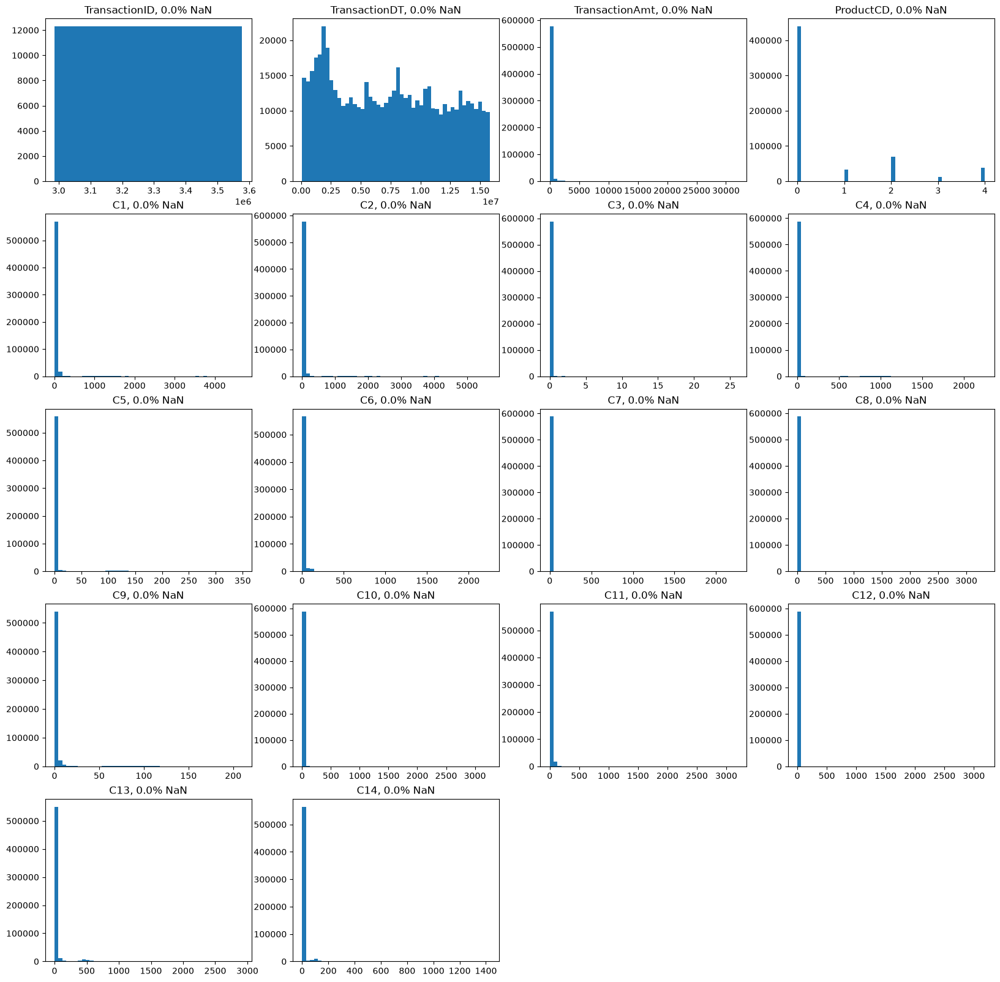

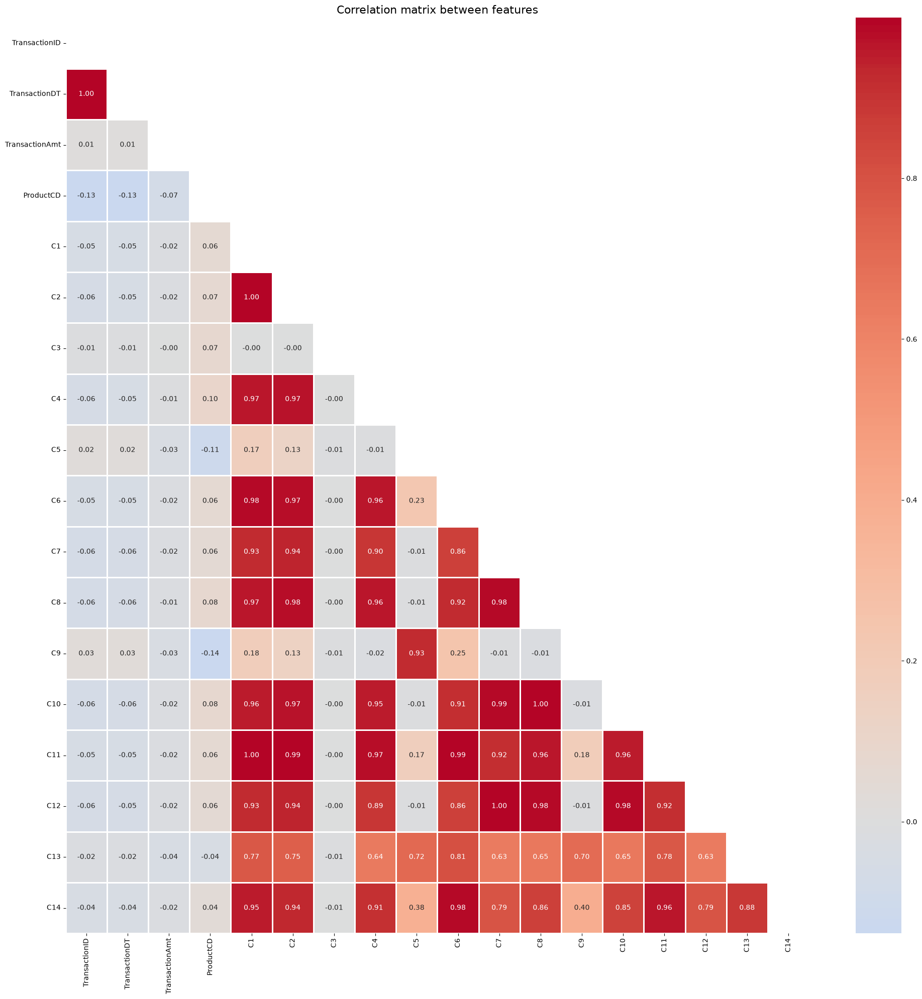

104688

In [8]:
# применяем label encoding для ProductCD 
productcd_dict = {v: k for k, v in df_trans['ProductCD'].unique().to_dict().items()}      
df_trans['ProductCD'] = df_trans['ProductCD'].map(productcd_dict)

pd.set_option("display.max_columns", None)
display(df_trans[nans_groups[0]].describe())

make_hist(df_trans, nans_groups[0])
make_heatmap(df_trans, nans_groups[0])

gc.collect()

### 'card1-card6', 'addr1', 'addr2', 'dist1', 'dist2'

,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2
count,590540.000000,581607.000000,588975.000000,590540.000000,586281.000000,590540.000000,524834.000000,524834.000000,238269.000000,37627.000000
mean,9898.734658,362.555488,153.194925,1.676505,199.278897,0.750550,290.733794,86.800630,118.502180,231.855423
std,4901.170153,157.793246,11.336444,0.534415,41.244453,0.439494,101.741072,2.690623,371.872026,529.053494
min,1000.000000,100.000000,100.000000,0.000000,100.000000,0.000000,100.000000,10.000000,0.000000,0.000000
25%,6019.000000,214.000000,150.000000,1.000000,166.000000,0.000000,204.000000,87.000000,3.000000,7.000000
50%,9678.000000,361.000000,150.000000,2.000000,226.000000,1.000000,299.000000,87.000000,8.000000,37.000000
75%,14184.000000,512.000000,150.000000,2.000000,226.000000,1.000000,330.000000,87.000000,24.000000,206.000000
max,18396.000000,600.000000,231.000000,4.000000,237.000000,4.000000,540.000000,102.000000,10286.000000,11623.000000


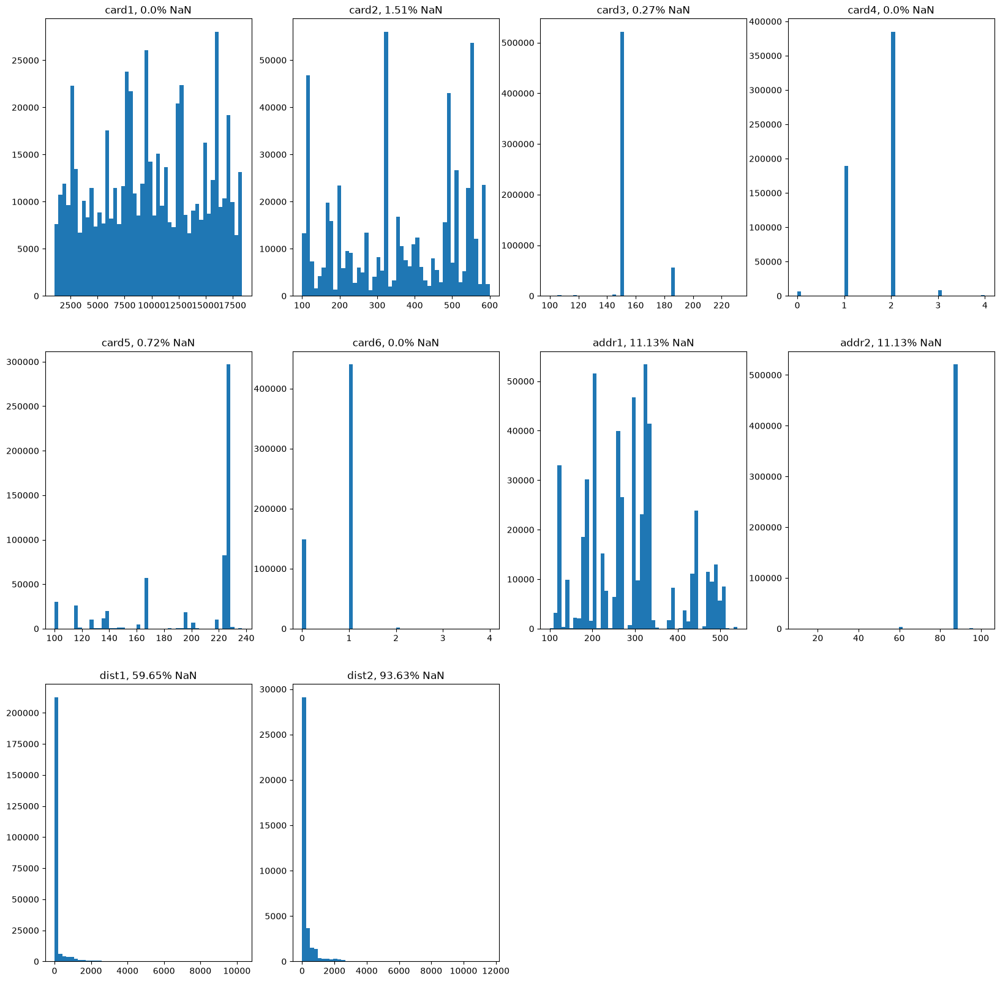

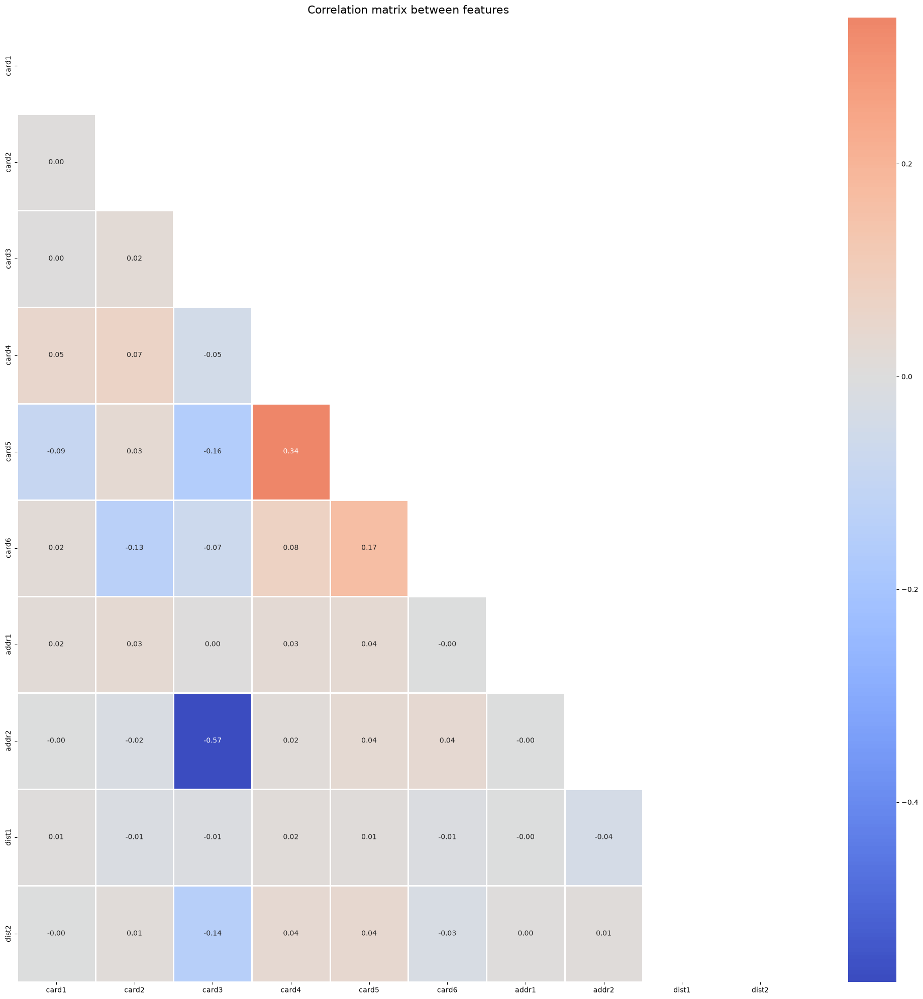

In [9]:
cols = ['card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2']

card_cols = ['card4', 'card6']
for col in card_cols:
    col_dict = {v: k for k, v in df_trans[col].unique().to_dict().items()}      
    df_trans[col] = df_trans[col].map(col_dict)

display(df_trans[cols].describe())
make_hist(df_trans, cols)
make_heatmap(df_trans, cols)

### D1-D15

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
count,589271.000000,309743.000000,327662.000000,421618.000000,280699.000000,73187.000000,38917.000000,74926.000000,74926.000000,514518.000000,311253.000000,64717.000000,61952.000000,62187.000000,501427.000000
mean,94.347568,169.563231,28.343348,140.002441,42.335965,69.805717,41.638950,146.058108,0.561057,123.982137,146.621465,54.037533,17.901295,57.724444,163.744579
std,157.660387,177.315865,62.384721,191.096774,89.000144,143.669253,99.743264,231.663840,0.316880,182.615225,186.042622,124.274558,67.614425,136.312450,202.726660
min,0.000000,0.000000,0.000000,-122.000000,0.000000,-83.000000,0.000000,0.000000,0.000000,0.000000,-53.000000,-83.000000,0.000000,-193.000000,-83.000000
25%,0.000000,26.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.958333,0.208333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,97.000000,8.000000,26.000000,10.000000,0.000000,0.000000,37.875000,0.666666,15.000000,43.000000,0.000000,0.000000,0.000000,52.000000
75%,122.000000,276.000000,27.000000,253.000000,32.000000,40.000000,17.000000,187.958328,0.833333,197.000000,274.000000,13.000000,0.000000,2.000000,314.000000
max,640.000000,640.000000,819.000000,869.000000,819.000000,873.000000,843.000000,1707.791626,0.958333,876.000000,670.000000,648.000000,847.000000,878.000000,879.000000


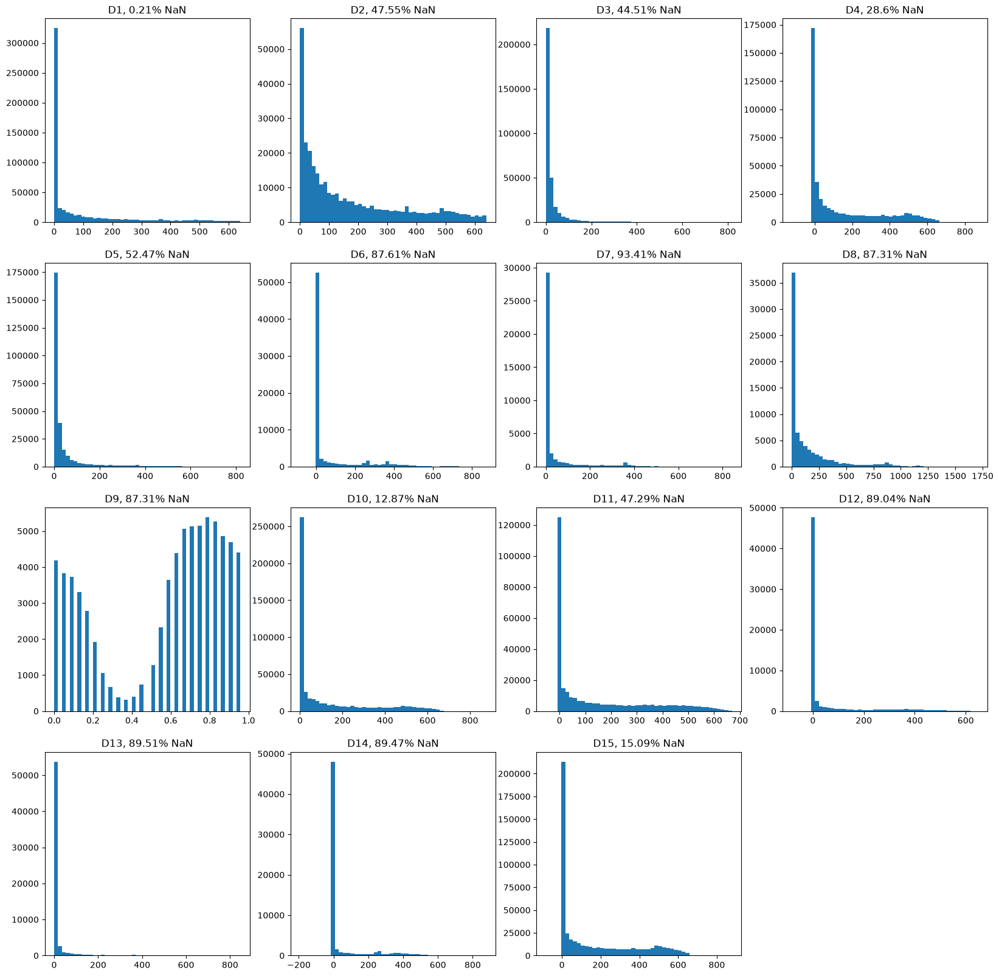

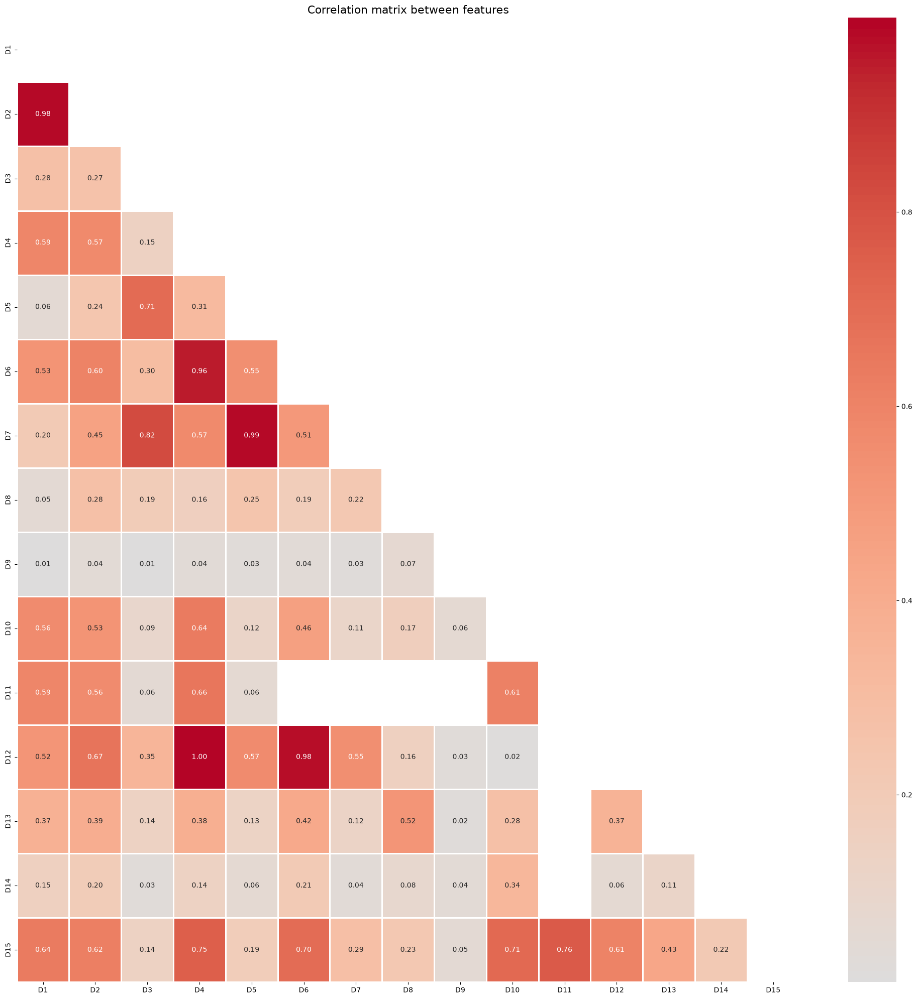

85033

In [10]:
cols = [f'D{i}' for i in range(1, 16)]

display(df_trans[cols].describe())
make_hist(df_trans, cols)
make_heatmap(df_trans, cols)

gc.collect()

### M1-M9

,M1,M2,M3,M4,M5,M6,M7,M8,M9
count,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000,590540.000000
mean,0.459156,0.574125,0.688384,1.554122,1.369138,0.959420,0.469360,0.564441,0.761920
std,0.498414,0.599633,0.666202,0.792922,0.825583,0.782631,0.600407,0.739860,0.936964
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,2.000000,2.000000,2.000000,1.000000,1.000000,2.000000
max,2.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000


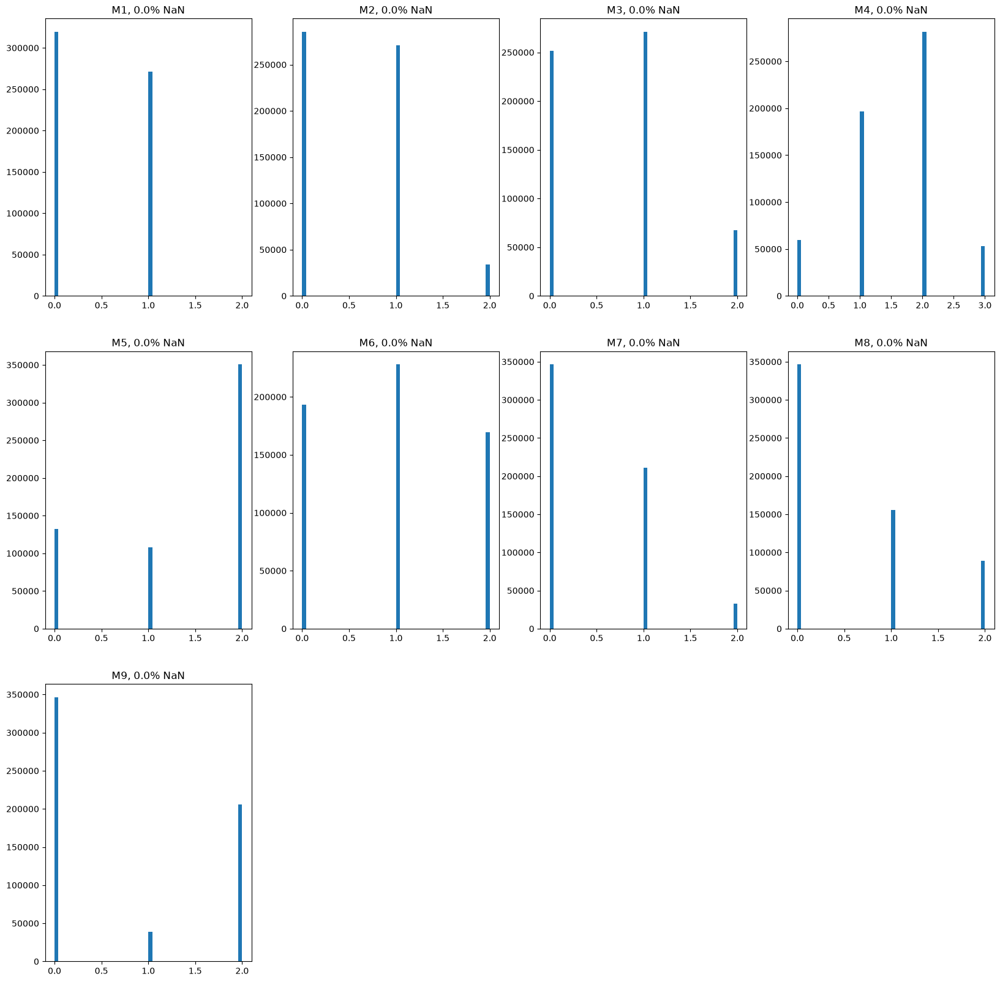

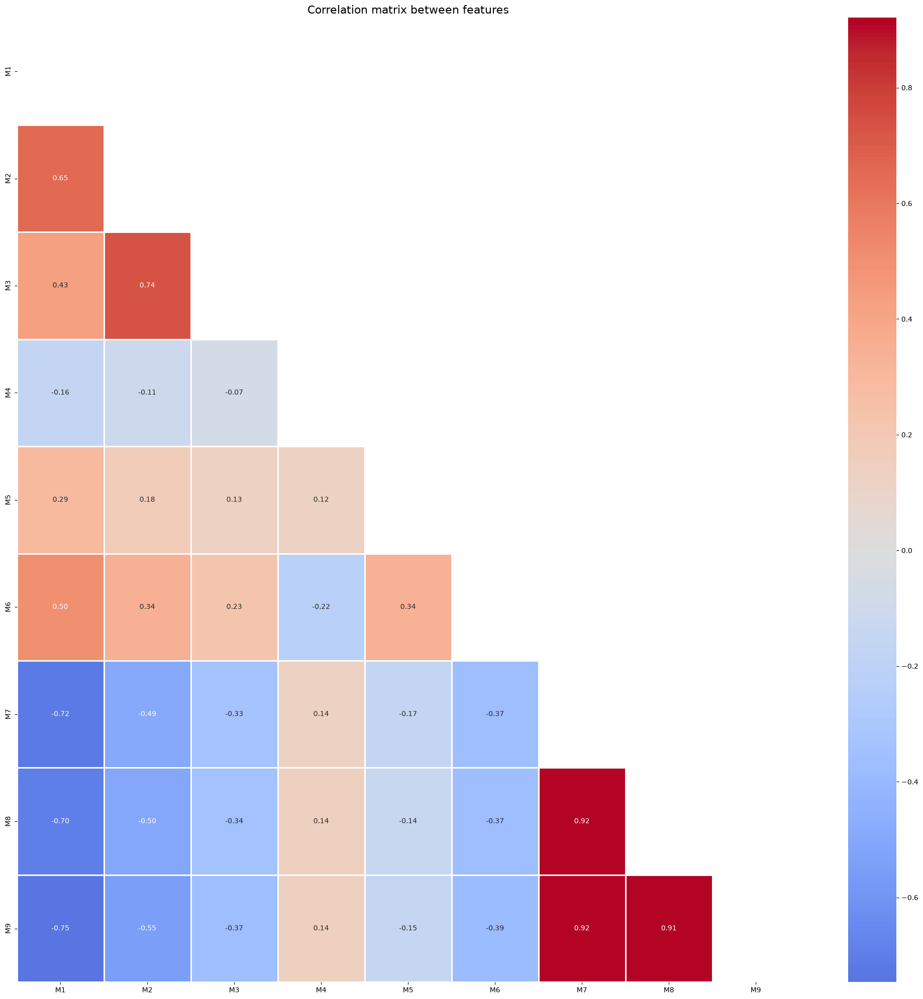

54353

In [11]:
cols = [f'M{i}' for i in range(1, 10)]
for col in cols:
    col_dict = {v: k for k, v in df_trans[col].unique().to_dict().items()}      
    df_trans[col] = df_trans[col].map(col_dict)

display(df_trans[cols].describe())
make_hist(df_trans, cols)
make_heatmap(df_trans, cols)

gc.collect()

### 'D1', 'V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315'

,D1,V281,V282,V283,V288,V289,V296,V300,V301,V313,V314,V315
count,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000,589271.000000
mean,94.347568,0.087783,0.817171,0.991114,0.184350,0.235975,0.328917,0.045507,0.052002,21.351473,43.319172,26.806976
std,157.660387,0.512748,0.921880,1.558731,0.430989,0.599231,3.264744,0.289573,0.318310,95.902969,173.619034,116.853218
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,122.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,640.000000,22.000000,32.000000,68.000000,10.000000,12.000000,93.000000,11.000000,13.000000,4817.469727,7519.869629,4817.469727


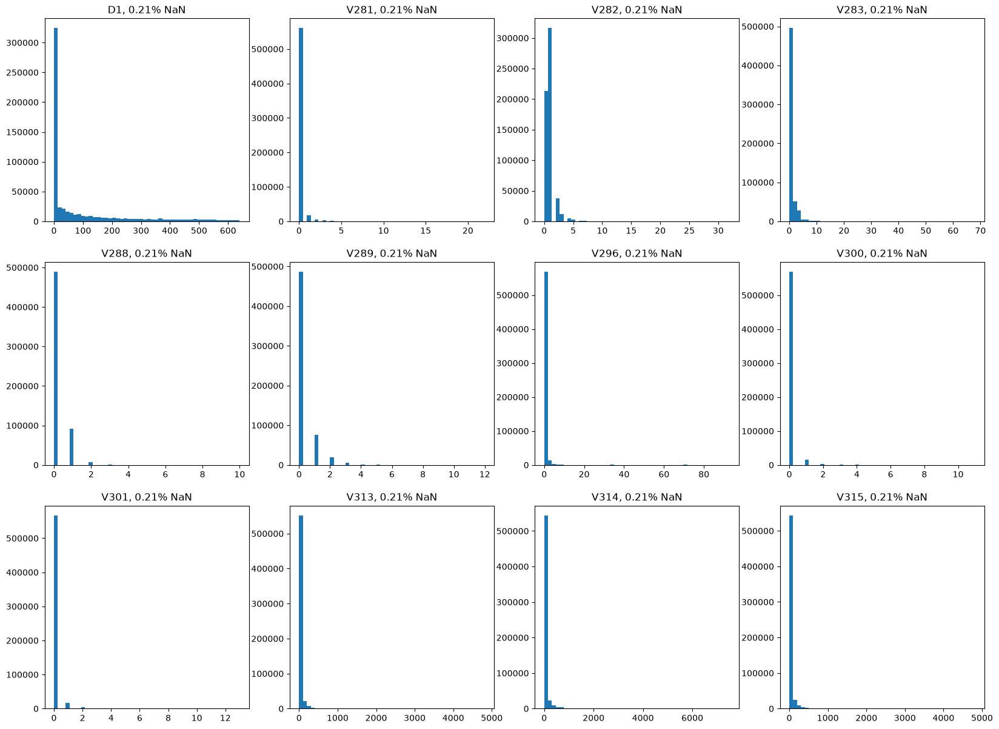

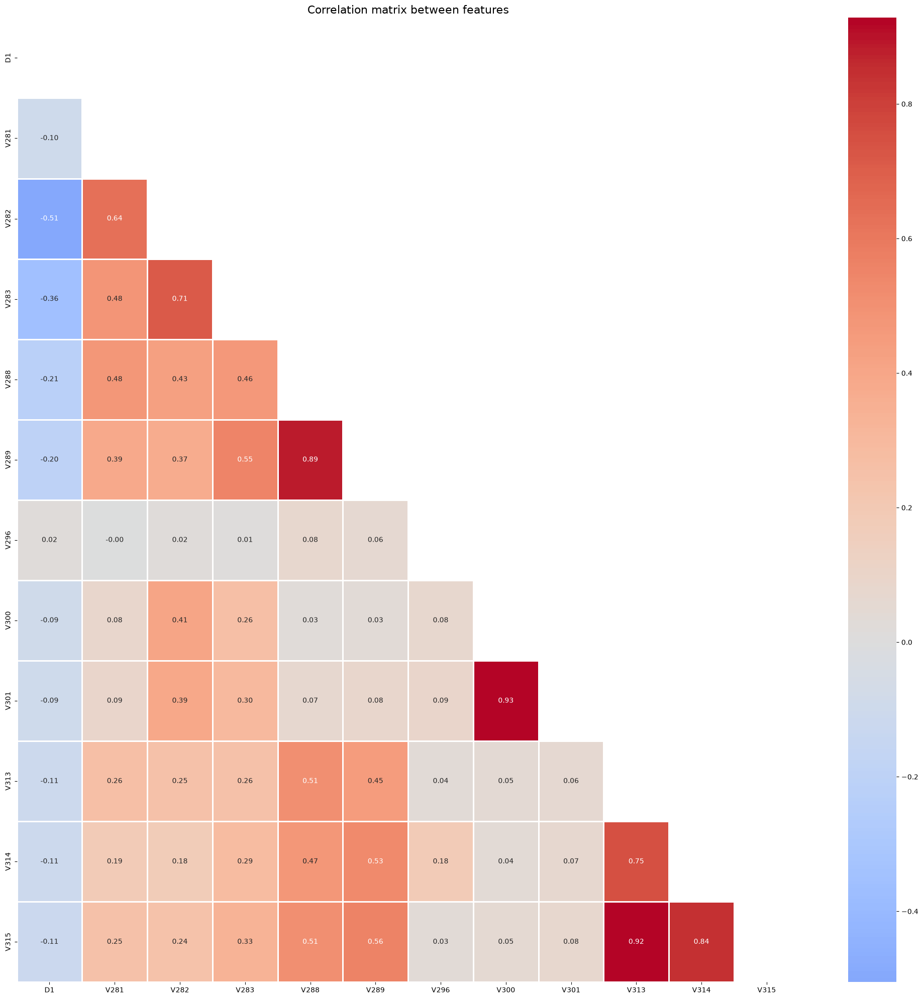

72038

In [12]:
display(df_trans[nans_groups[1269]].describe())
make_hist(df_trans, nans_groups[1269])
make_heatmap(df_trans, nans_groups[1269])

gc.collect()

### 'D11', 'V1-V11'

,D11,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11
count,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000,311253.000000
mean,146.621465,0.999945,1.045204,1.078075,0.846456,0.876991,1.045686,1.072870,1.027704,1.041529,0.463915,0.478987
std,186.042622,0.007390,0.240133,0.320890,0.440053,0.475902,0.239385,0.304779,0.186069,0.226339,0.521522,0.552431
min,-53.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
50%,43.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
75%,274.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,670.000000,1.000000,8.000000,9.000000,6.000000,6.000000,9.000000,9.000000,8.000000,8.000000,4.000000,5.000000


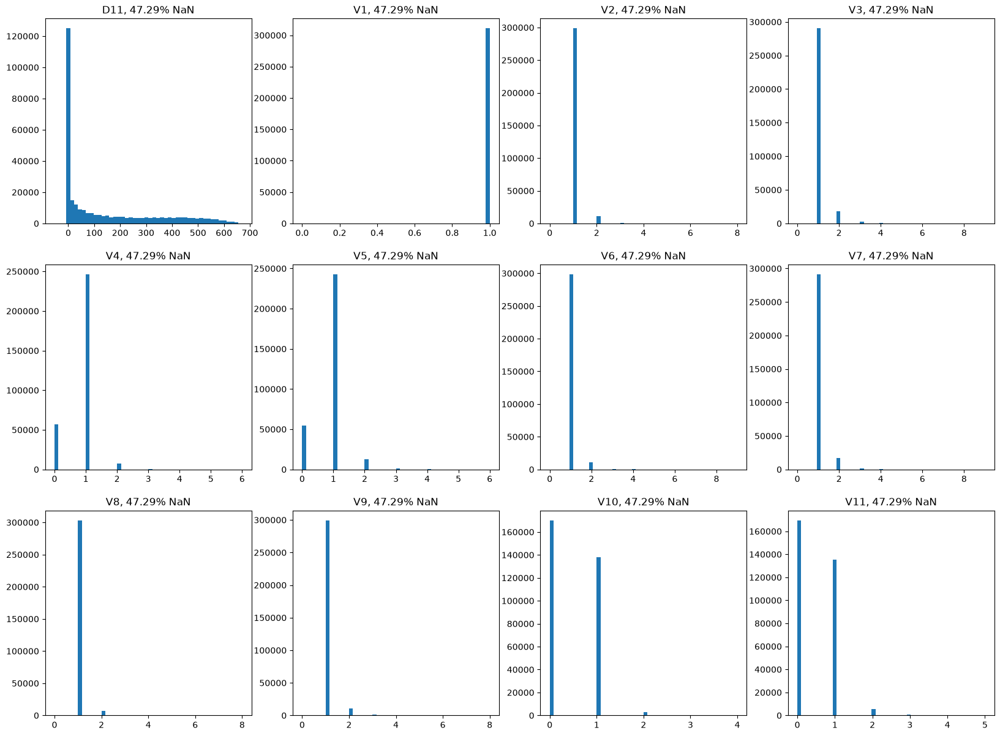

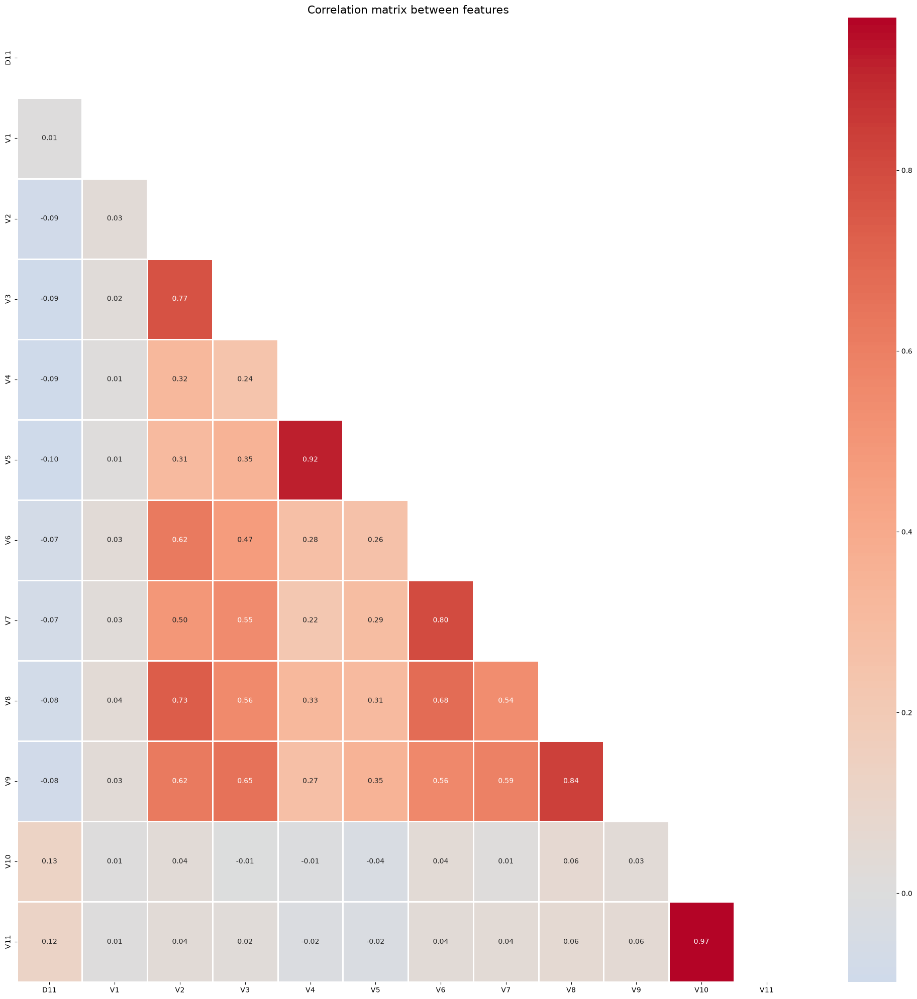

72441

In [13]:
display(df_trans[nans_groups[279287]].describe())
make_hist(df_trans, nans_groups[279287])
make_heatmap(df_trans, nans_groups[279287])

gc.collect()

### 'V12-V34'

,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34
count,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000,514467.000000
mean,0.559711,0.599166,0.999500,0.122342,0.123460,0.134040,0.135363,0.816371,0.847843,0.129684,0.132292,1.034791,1.058097,0.977660,0.988040,0.000776,0.000830,0.387840,0.406436,0.140761,0.142417,0.130693,0.139154
std,0.510533,0.532185,0.022345,0.332422,0.342841,0.364457,0.371763,0.425512,0.459451,0.339060,0.359415,0.247681,0.305485,0.185245,0.209302,0.028596,0.031133,0.510652,0.554311,0.355793,0.368278,0.340900,0.357549
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,3.000000,6.000000,1.000000,7.000000,15.000000,15.000000,15.000000,7.000000,15.000000,5.000000,8.000000,13.000000,13.000000,7.000000,13.000000,4.000000,4.000000,5.000000,9.000000,7.000000,15.000000,7.000000,13.000000


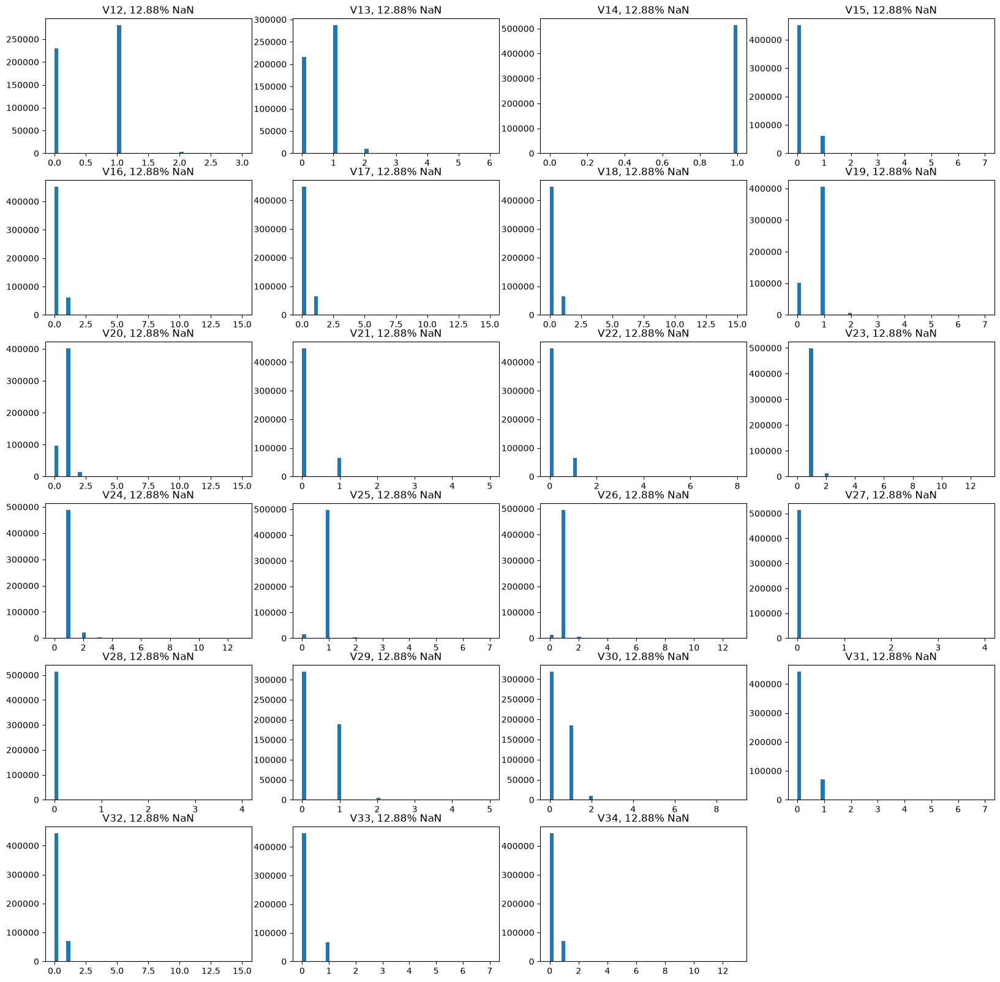

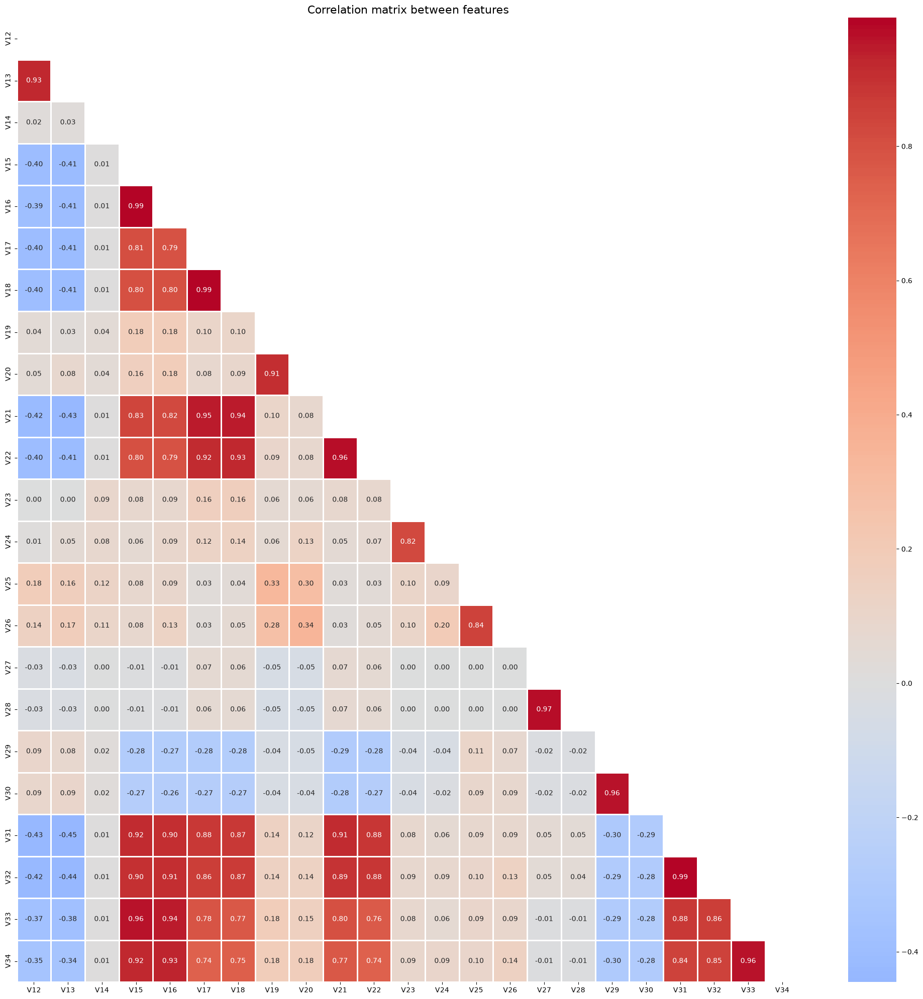

133382

In [14]:
display(df_trans[nans_groups[76073]].describe())
make_hist(df_trans, nans_groups[76073])
make_heatmap(df_trans, nans_groups[76073])

gc.collect()

### V35-V52

,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52
count,421571.000000,421571.000000,421571.000000,421571.00000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000,421571.000000
mean,0.542594,0.579198,1.108065,1.16240,0.166076,0.177145,0.999269,0.156118,0.168942,1.083891,1.120779,1.022286,1.038515,0.383174,0.397724,0.164746,0.170579,0.182695
std,0.516010,0.539039,0.690571,0.85892,0.451956,0.505786,0.027020,0.382896,0.433359,0.639143,0.729774,0.166719,0.231862,0.508189,0.542654,0.373995,0.403899,0.439002
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,1.00000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.00000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,1.00000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,3.000000,5.000000,54.000000,54.00000,15.000000,24.000000,1.000000,8.000000,8.000000,48.000000,48.000000,6.000000,12.000000,5.000000,5.000000,5.000000,6.000000,12.000000


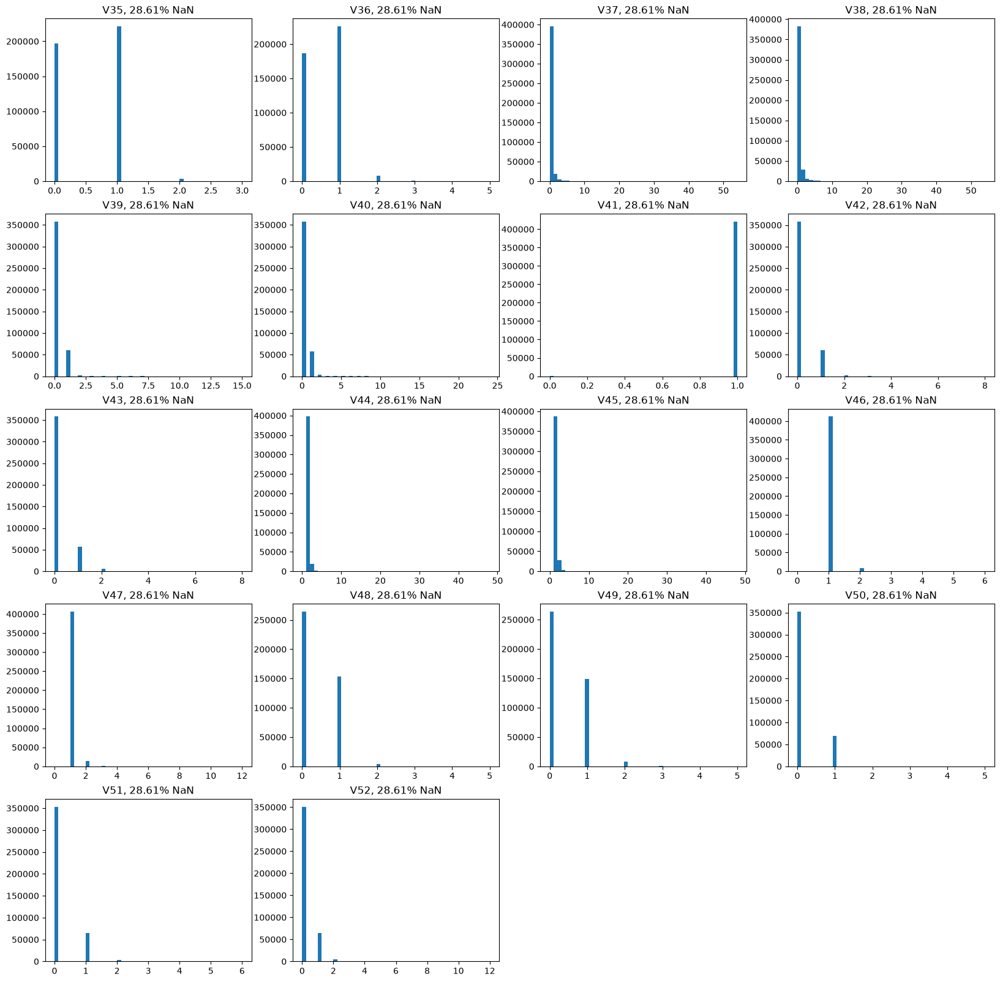

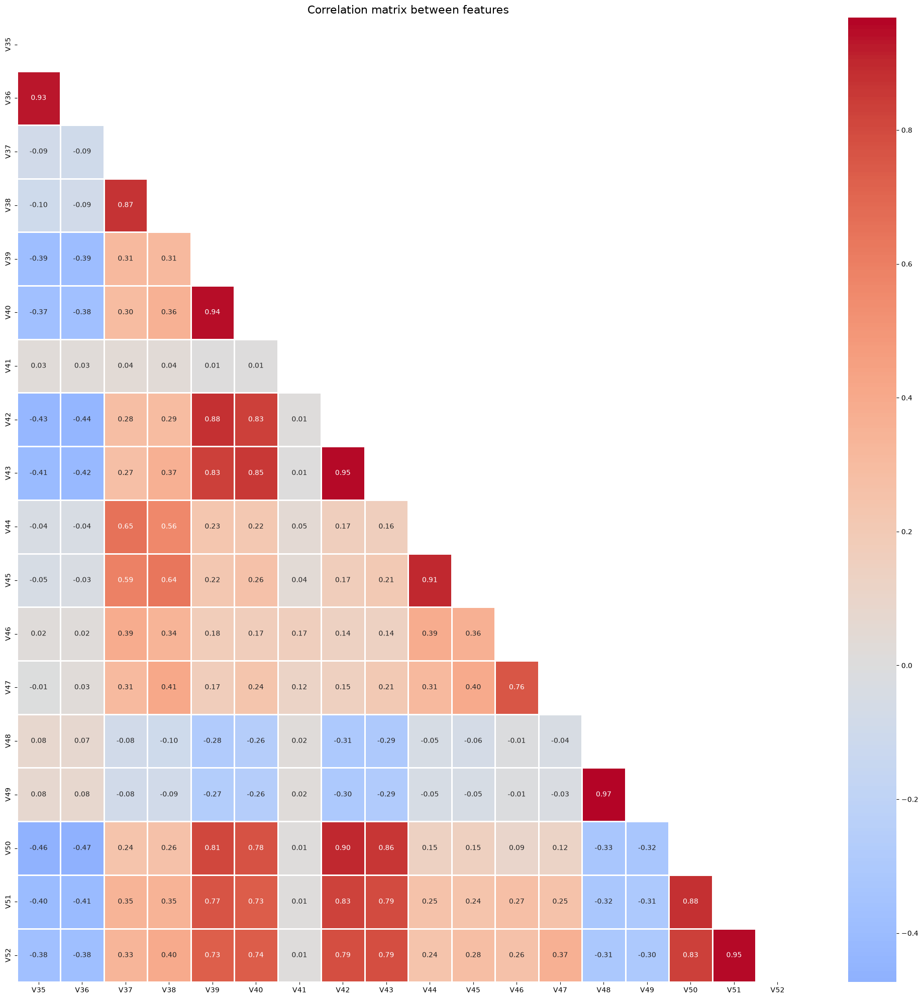

106852

In [15]:
display(df_trans[nans_groups[168969]].describe())
make_hist(df_trans, nans_groups[168969])
make_heatmap(df_trans, nans_groups[168969])

gc.collect()

#### V53-V74

,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74
count,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000,513444.000000
mean,0.577586,0.619982,1.067670,1.120979,0.128312,0.132453,0.134433,0.142537,0.829785,0.867563,0.130743,0.141825,0.999663,0.981038,0.998121,0.000534,0.390200,0.407924,0.140639,0.145124,0.139982,0.152147
std,0.511571,0.534635,0.391364,0.661128,0.349094,0.372907,0.379291,0.418230,0.436617,0.483803,0.355263,0.406157,0.018353,0.216235,0.245912,0.023760,0.513696,0.554499,0.364303,0.389212,0.367098,0.393274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,5.000000,6.000000,17.000000,51.000000,6.000000,10.000000,16.000000,16.000000,6.000000,10.000000,7.000000,7.000000,1.000000,7.000000,8.000000,2.000000,5.000000,6.000000,6.000000,10.000000,7.000000,8.000000


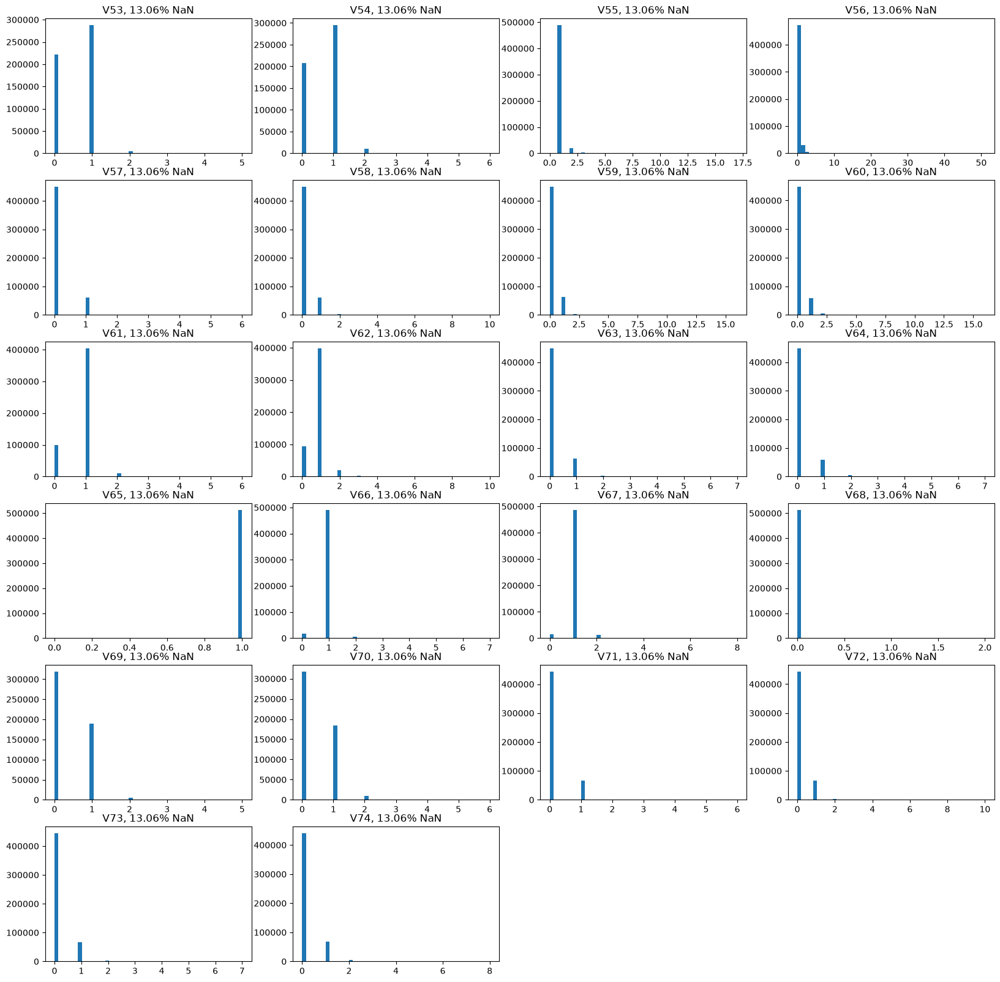

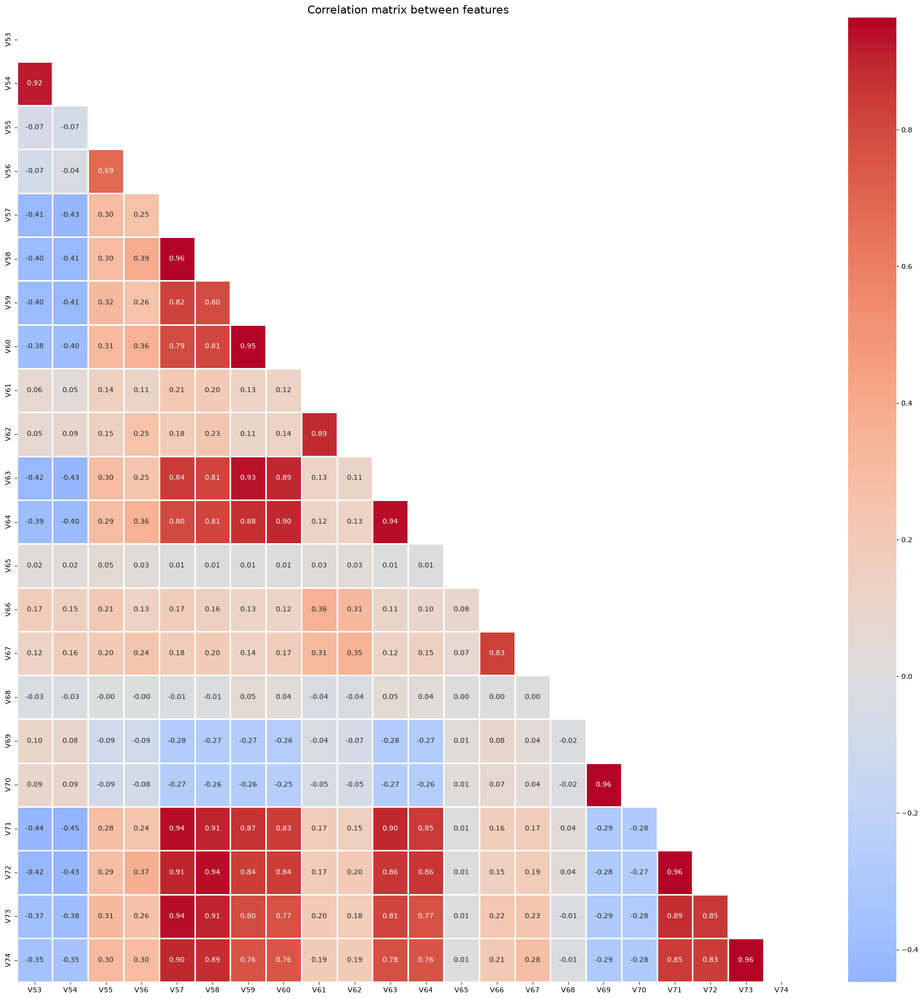

19133

In [16]:
display(df_trans[nans_groups[77096]].describe())
make_hist(df_trans, nans_groups[77096])
make_heatmap(df_trans, nans_groups[77096])

gc.collect()

#### V75-V94

,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94
count,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000,501376.000000
mean,0.544278,0.587557,1.086893,1.144462,0.136867,0.143954,0.152696,0.844610,0.881965,0.137145,0.149788,1.064885,1.099456,0.999246,0.000902,0.401862,0.420461,0.150322,0.154812,0.137007
std,0.514318,0.538230,0.532958,0.781474,0.379904,0.409932,0.452298,0.422529,0.470757,0.361875,0.419445,0.419807,0.511281,0.027447,0.031943,0.516153,0.561865,0.375682,0.402314,0.343878
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,4.000000,6.000000,30.000000,31.000000,7.000000,19.000000,19.000000,7.000000,7.000000,7.000000,7.000000,30.000000,30.000000,1.000000,2.000000,5.000000,6.000000,7.000000,7.000000,2.000000


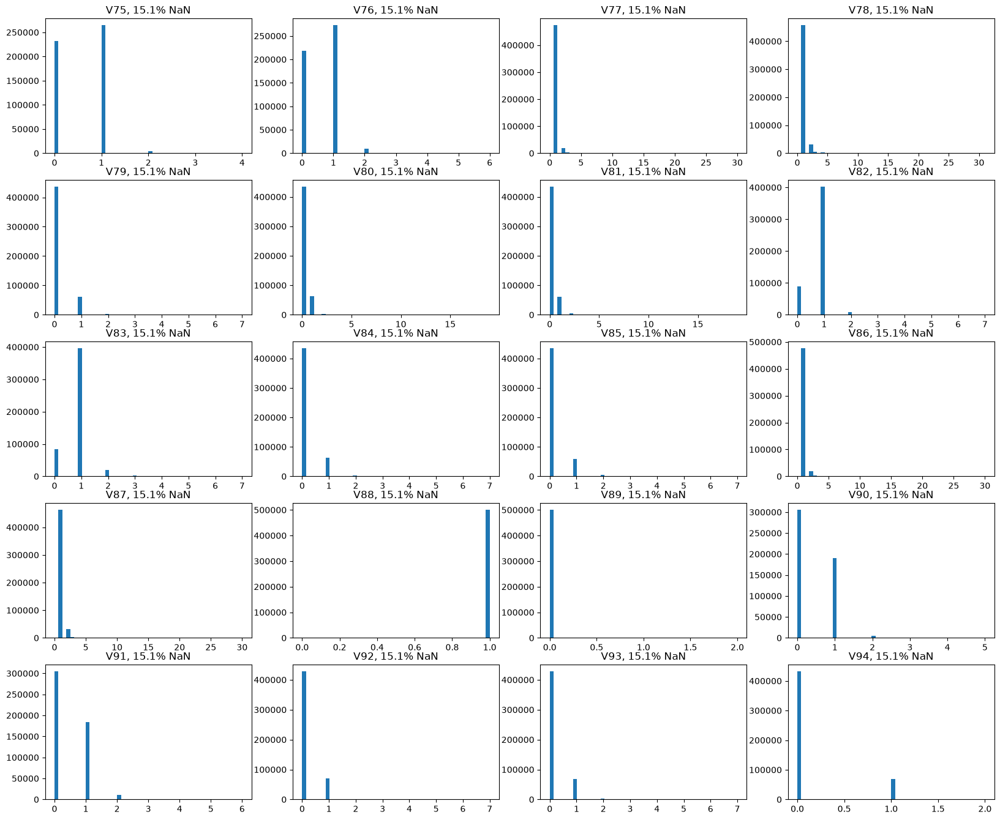

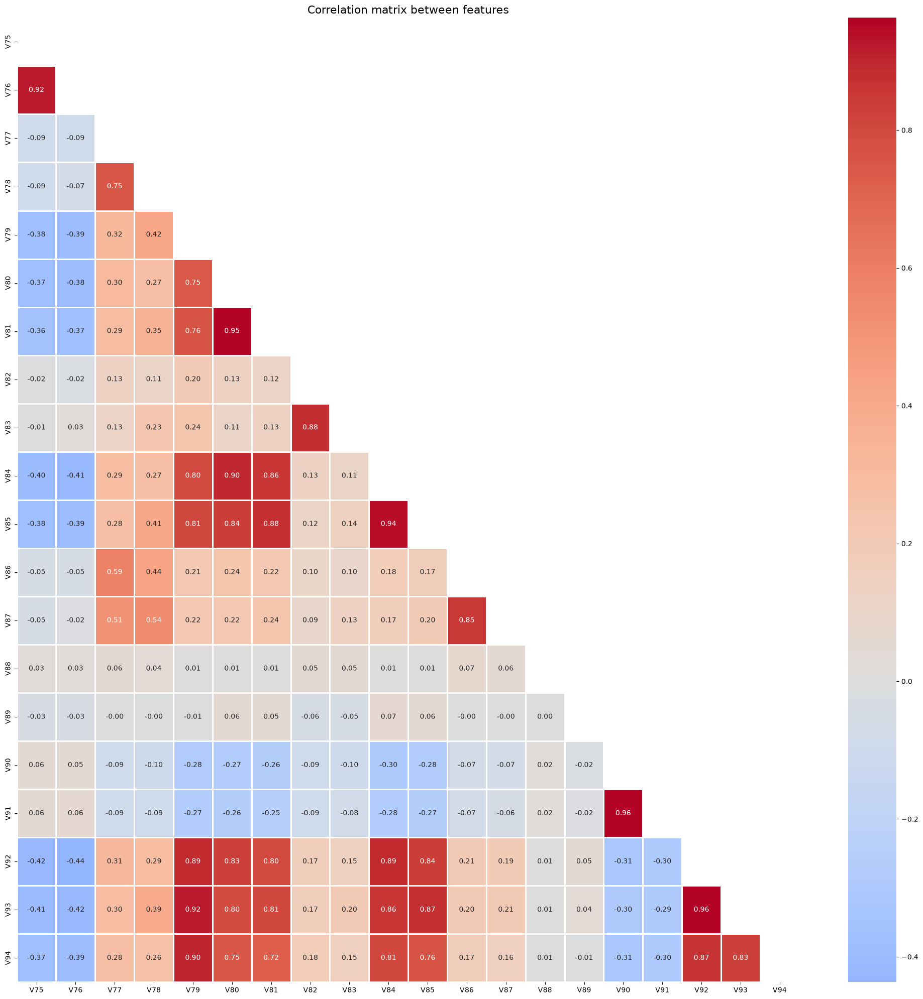

118197

In [17]:
display(df_trans[nans_groups[89164]].describe())
make_hist(df_trans, nans_groups[89164])
make_heatmap(df_trans, nans_groups[89164])

gc.collect()

#### V95-V137

,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137
count,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.00000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000,590226.000000
mean,1.038019,3.005189,1.718933,0.061985,0.894986,0.273504,0.889249,1.827229,1.279288,0.085433,0.281145,0.164584,0.999580,1.004614,1.014816,1.007739,1.002563,1.005356,1.003383,1.009298,1.032450,1.001474,1.000728,1.000874,1.004276,1.001759,1.031120,1.092975,1.050415,129.979416,336.611572,204.094040,8.768945,92.16584,31.133301,103.513176,204.889145,145.972321,17.250134,38.821198,26.365089
std,21.034304,40.239487,27.700449,0.284995,2.722552,0.947176,20.582573,35.928455,25.685642,0.648718,3.373948,1.825665,0.020494,0.081146,0.127769,0.097290,0.070830,0.084617,0.074754,0.110179,0.190385,0.041011,0.036392,0.041684,0.067097,0.048636,0.228134,0.374103,0.280037,2346.951660,4238.667480,3010.258789,113.832832,315.96048,161.161255,2266.105957,3796.316650,2772.986572,293.847565,451.808441,348.332703
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,107.950005,0.000000,0.000000,59.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,880.000000,1410.000000,976.000000,12.000000,88.000000,28.000000,869.000000,1285.000000,928.000000,15.000000,99.000000,55.000000,1.000000,7.000000,7.000000,7.000000,9.000000,9.000000,9.000000,6.000000,6.000000,3.000000,3.000000,3.000000,3.000000,3.000000,13.000000,13.000000,13.000000,160000.000000,160000.000000,160000.000000,55125.000000,55125.00000,55125.000000,93736.000000,133915.000000,98476.000000,90750.000000,90750.000000,90750.000000


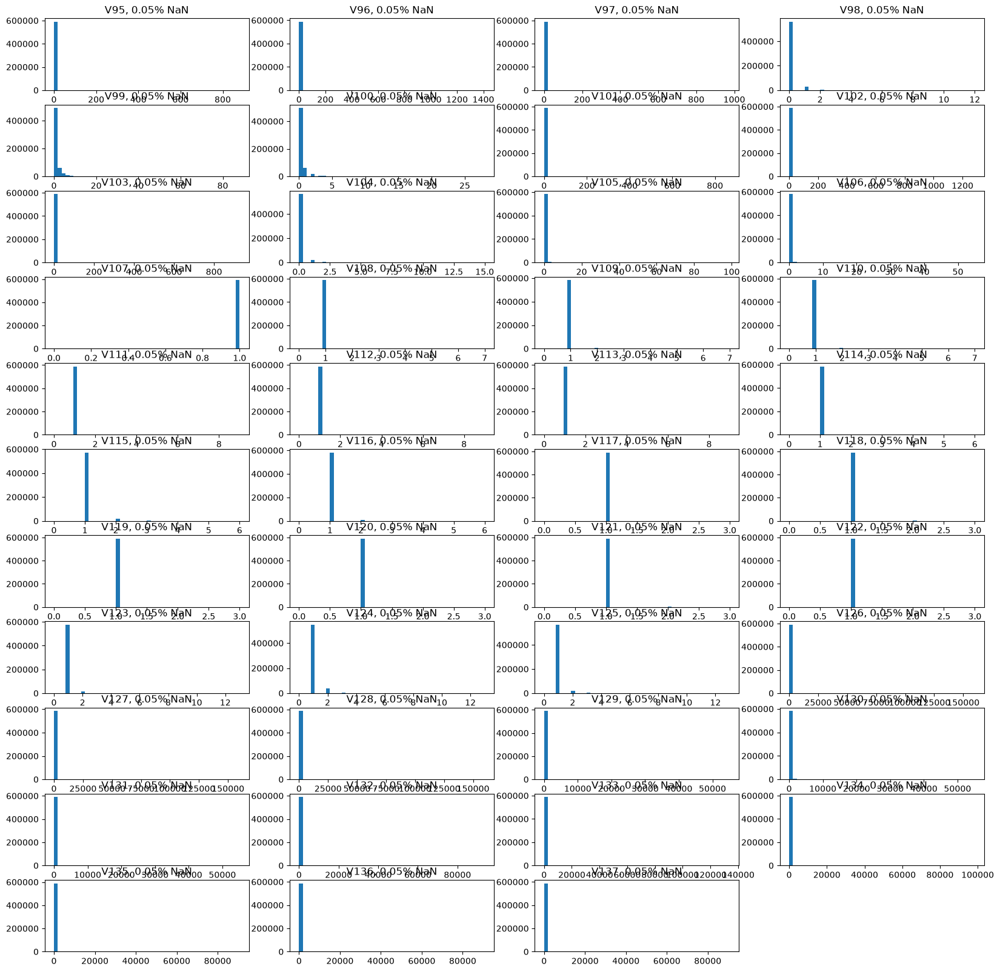

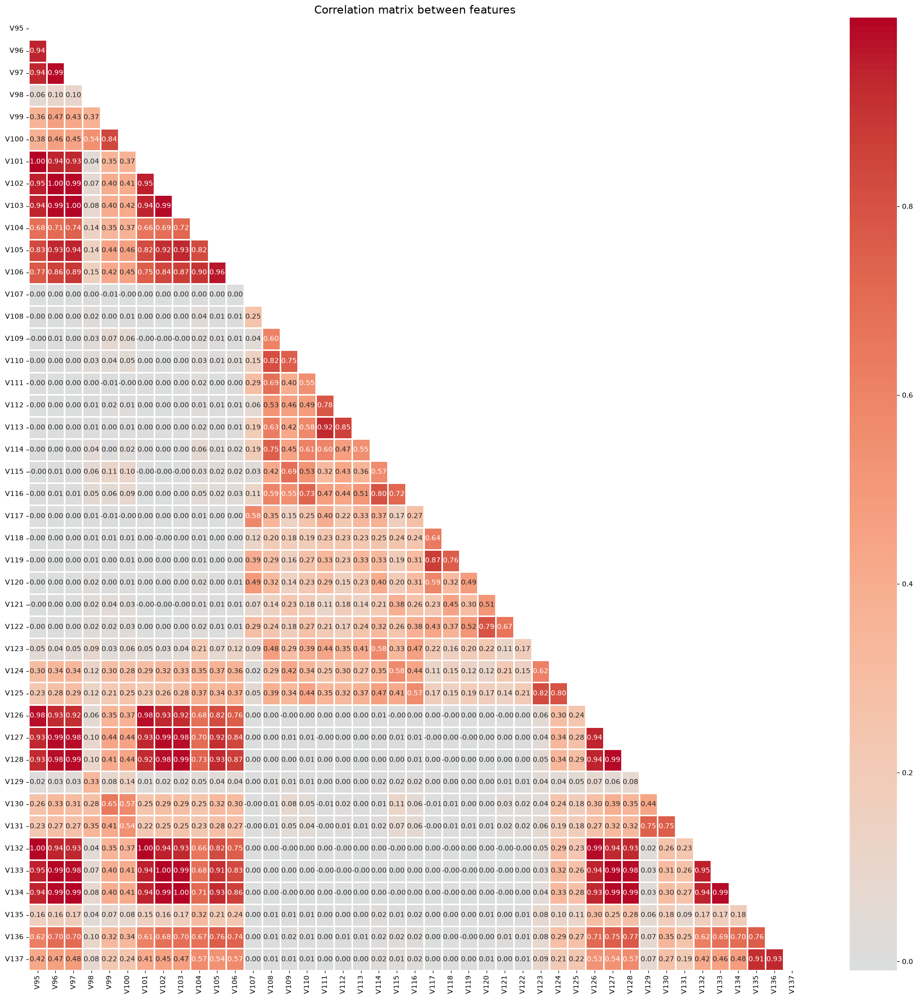

259836

In [18]:
display(df_trans[nans_groups[314]].describe())
make_hist(df_trans, nans_groups[314])
make_heatmap(df_trans, nans_groups[314])

gc.collect()

#### V138~V163

,V138,V139,V140,V141,V142,V146,V147,V148,V149,V153,V154,V155,V156,V157,V158,V161,V162,V163
count,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000,81945.000000
mean,0.036439,1.073915,1.125267,0.037696,0.048581,0.156276,0.168601,0.765001,0.775313,0.753200,0.757423,0.767381,0.777485,0.817573,0.833461,4.843938,6.594661,5.505955
std,0.428490,1.333924,1.467850,0.215133,0.313888,0.682328,0.750497,0.581425,0.628191,0.532649,0.546907,0.602678,0.647209,0.682016,0.734336,58.929760,69.195175,63.077885
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,22.000000,33.000000,33.000000,5.000000,9.000000,24.000000,26.000000,20.000000,20.000000,18.000000,18.000000,24.000000,24.000000,24.000000,24.000000,3300.000000,3300.000000,3300.000000


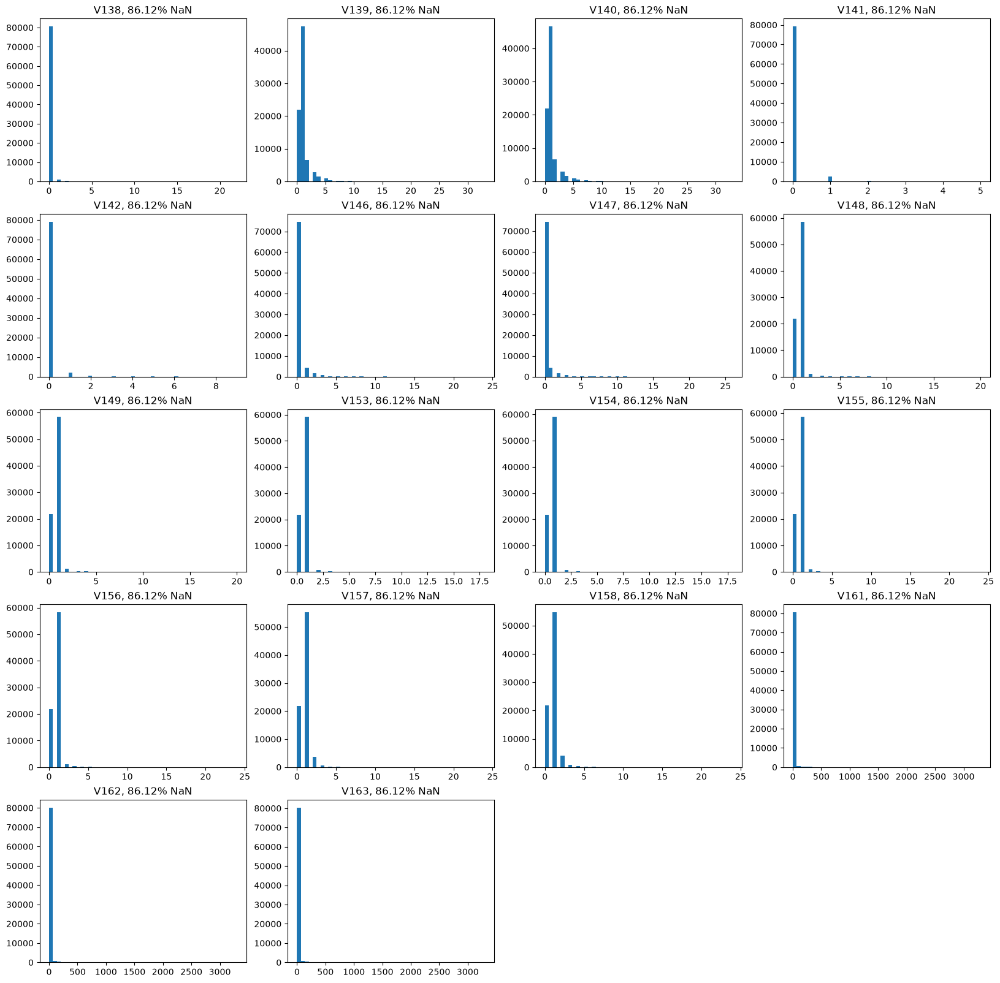

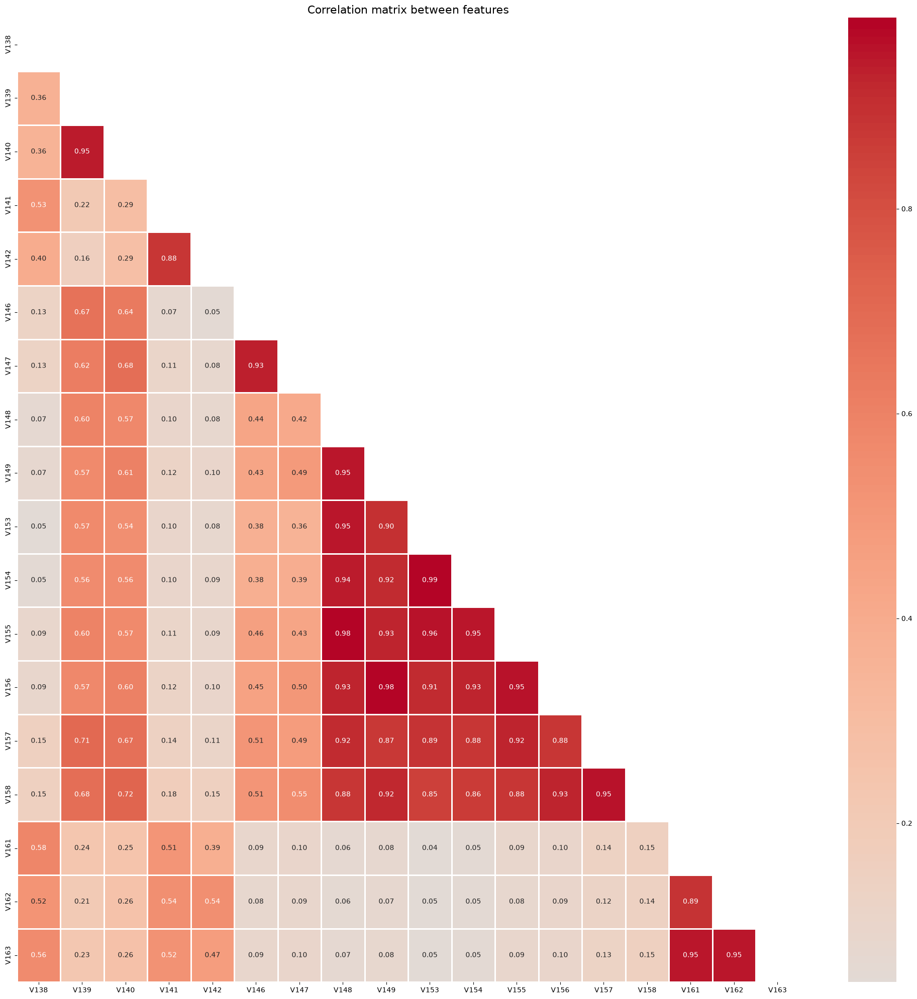

105967

In [19]:
display(df_trans[nans_groups[508595]].describe())
make_hist(df_trans, nans_groups[508595])
make_heatmap(df_trans, nans_groups[508595])

gc.collect()

#### V143~V166

,V143,V144,V145,V150,V151,V152,V159,V160,V164,V165,V166
count,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000,81951.000000
mean,8.397005,3.708484,22.112946,277.598022,6.460190,9.432710,2719.299805,47453.179688,877.888855,2239.912109,359.469421
std,55.267548,10.485633,64.371857,829.576904,15.232323,21.554487,8355.445312,142076.078125,6049.166992,8223.258789,1244.463257
min,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,869.000000,62.000000,297.000000,3389.000000,57.000000,69.000000,55125.000000,641511.375000,93736.000000,98476.000000,104060.000000


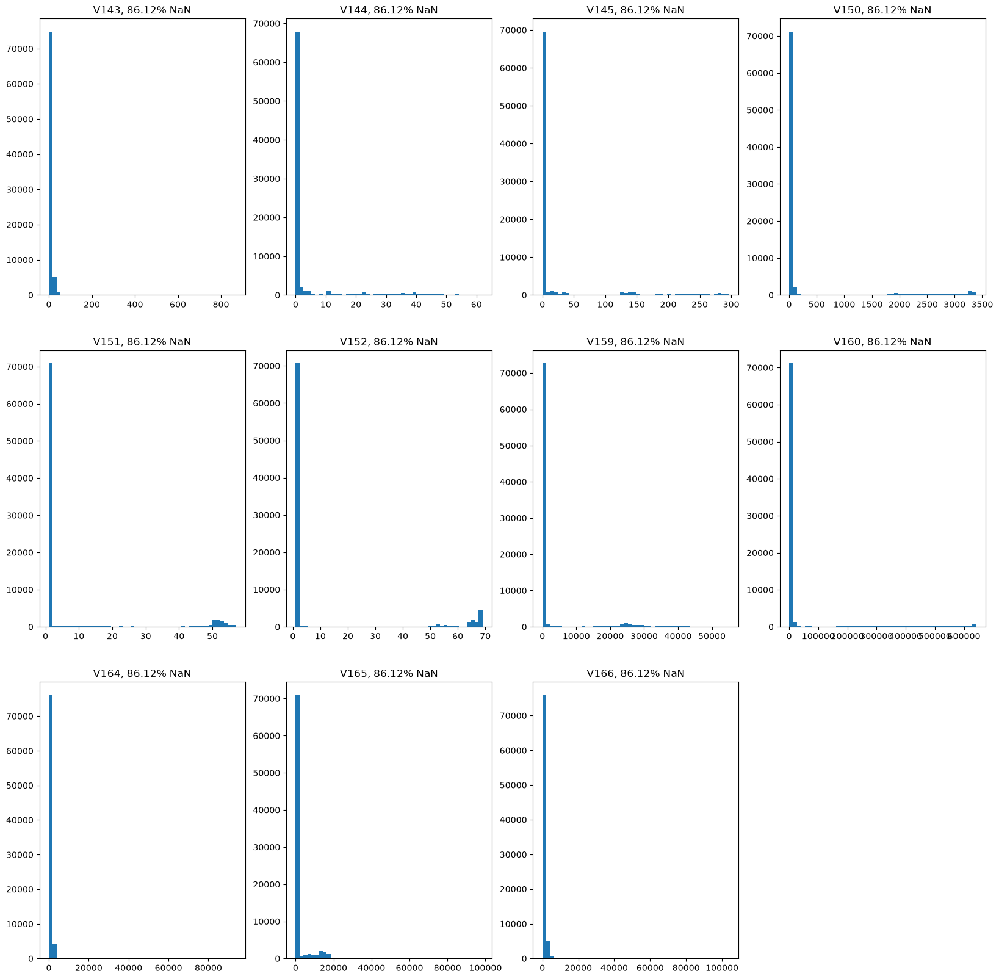

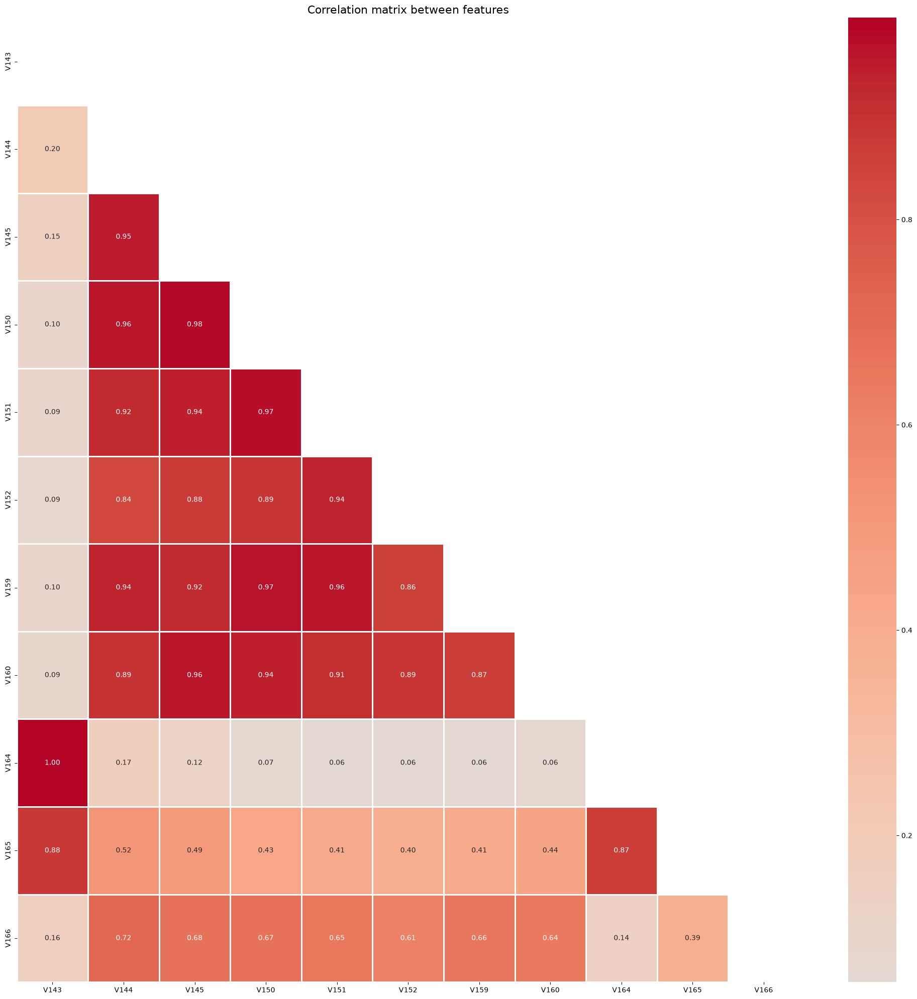

64754

In [20]:
display(df_trans[nans_groups[508589]].describe())
make_hist(df_trans, nans_groups[508589])
make_heatmap(df_trans, nans_groups[508589])

gc.collect()

#### V167~V216

,V167,V168,V172,V173,V176,V177,V178,V179,V181,V182,V183,V186,V187,V190,V191,V192,V193,V196,V199,V202,V203,V204,V205,V206,V207,V211,V212,V213,V214,V215,V216
count,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.00000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000,139631.000000
mean,3.929514,5.859501,0.132012,0.055231,1.376979,3.529245,6.649283,4.869012,0.253332,0.856243,0.484692,1.148799,1.843753,1.213083,1.058984,1.237361,1.149845,1.084580,1.270749,444.147156,1078.327393,686.956909,18.060417,6.18936,72.284096,385.137054,765.988403,536.302795,38.437546,133.208206,71.107147
std,42.200977,54.032471,0.924894,0.264439,1.829420,41.310623,69.447365,50.489429,1.248974,5.792934,2.946982,1.223529,9.884390,1.480319,0.677527,2.635962,1.714792,1.105834,1.671863,4683.828125,9105.608398,6048.980469,266.545471,191.47403,925.676697,4541.837891,7496.121094,5471.665039,571.834229,1040.453735,680.267639
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,30.924400,20.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,872.000000,964.000000,31.000000,7.000000,48.000000,861.000000,1235.000000,920.000000,24.000000,83.000000,41.000000,38.000000,218.000000,42.000000,21.000000,44.000000,37.000000,38.000000,45.000000,104060.000000,139777.000000,104060.000000,55125.000000,55125.00000,55125.000000,92888.000000,129006.000000,97628.000000,104060.000000,104060.000000,104060.000000


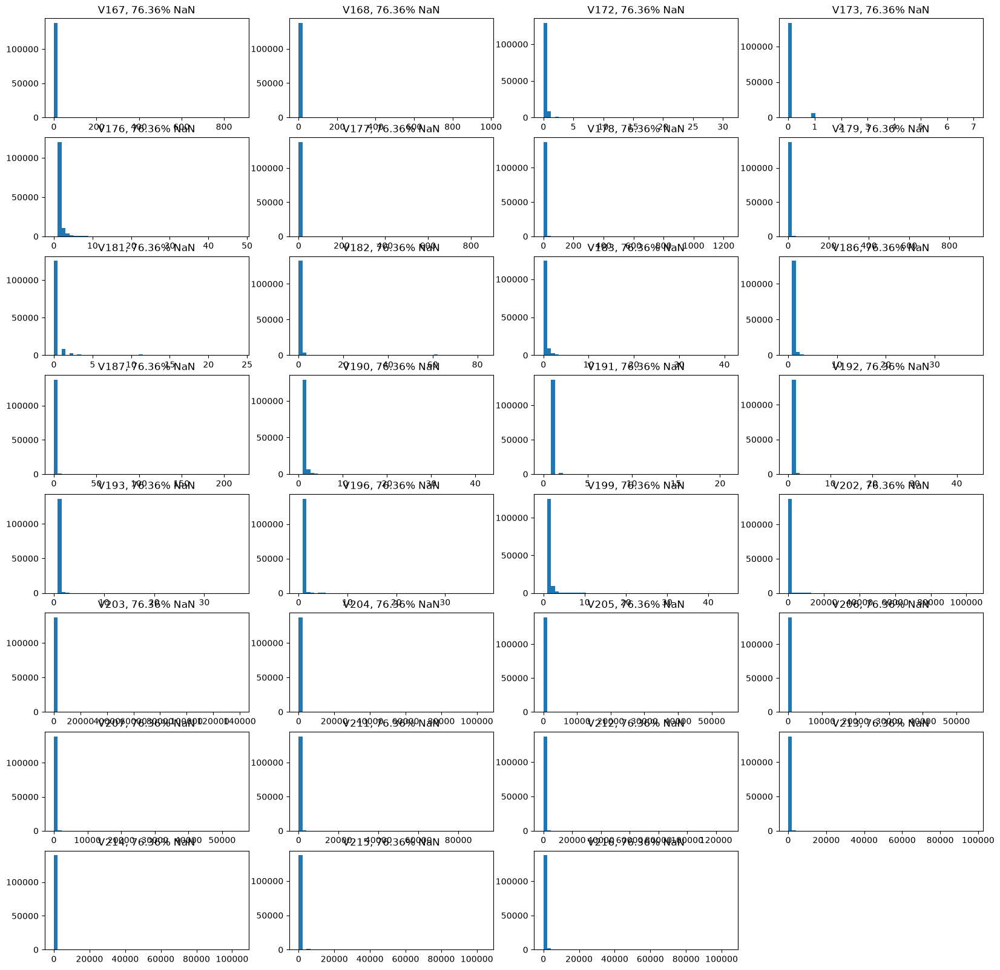

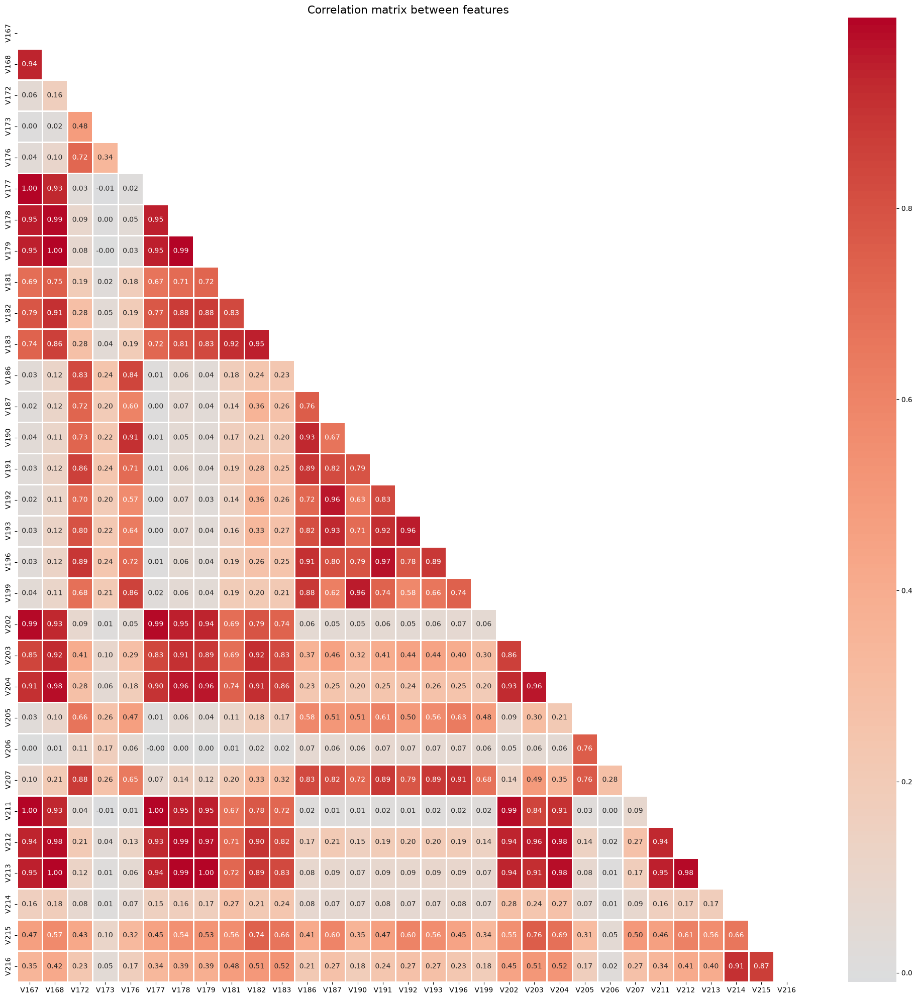

174901

In [21]:
display(df_trans[nans_groups[450909]].describe())
make_hist(df_trans, nans_groups[450909])
make_heatmap(df_trans, nans_groups[450909])

gc.collect()

#### V169~V210

,V169,V170,V171,V174,V175,V180,V184,V185,V188,V189,V194,V195,V197,V198,V200,V201,V208,V209,V210
count,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000,139819.000000
mean,0.168053,1.436779,1.690907,0.127794,0.212639,0.924123,0.132364,0.173903,1.014755,1.038314,0.945773,0.954227,0.949385,0.961951,1.119977,1.159106,8.888194,35.001869,14.391835
std,0.904944,1.751143,2.444748,0.379763,0.857133,6.112630,0.543699,0.699733,0.671207,0.792528,0.304158,0.376420,0.336871,0.493065,1.253853,1.418618,59.047123,250.800827,86.523727
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,19.000000,48.000000,61.000000,8.000000,14.000000,83.000000,16.000000,31.000000,30.000000,30.000000,7.000000,16.000000,14.000000,21.000000,45.000000,55.000000,3300.000000,8050.000000,3300.000000


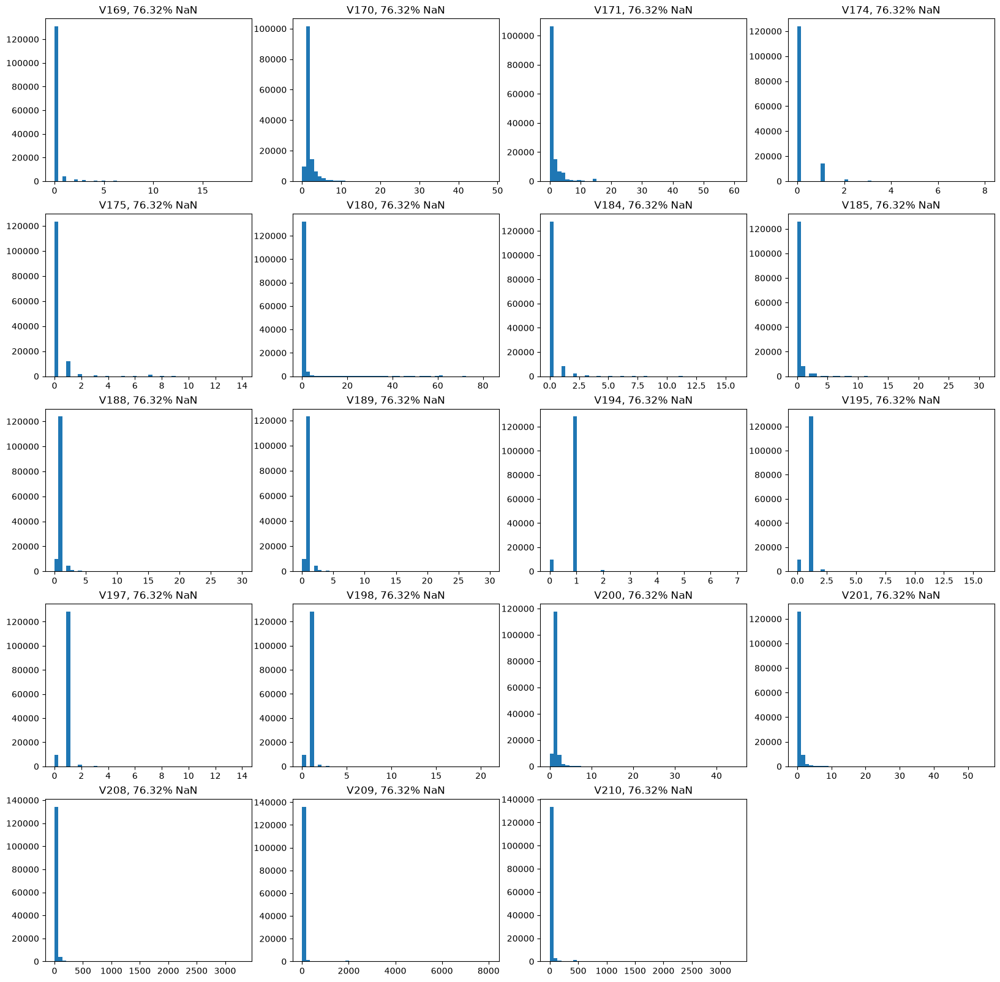

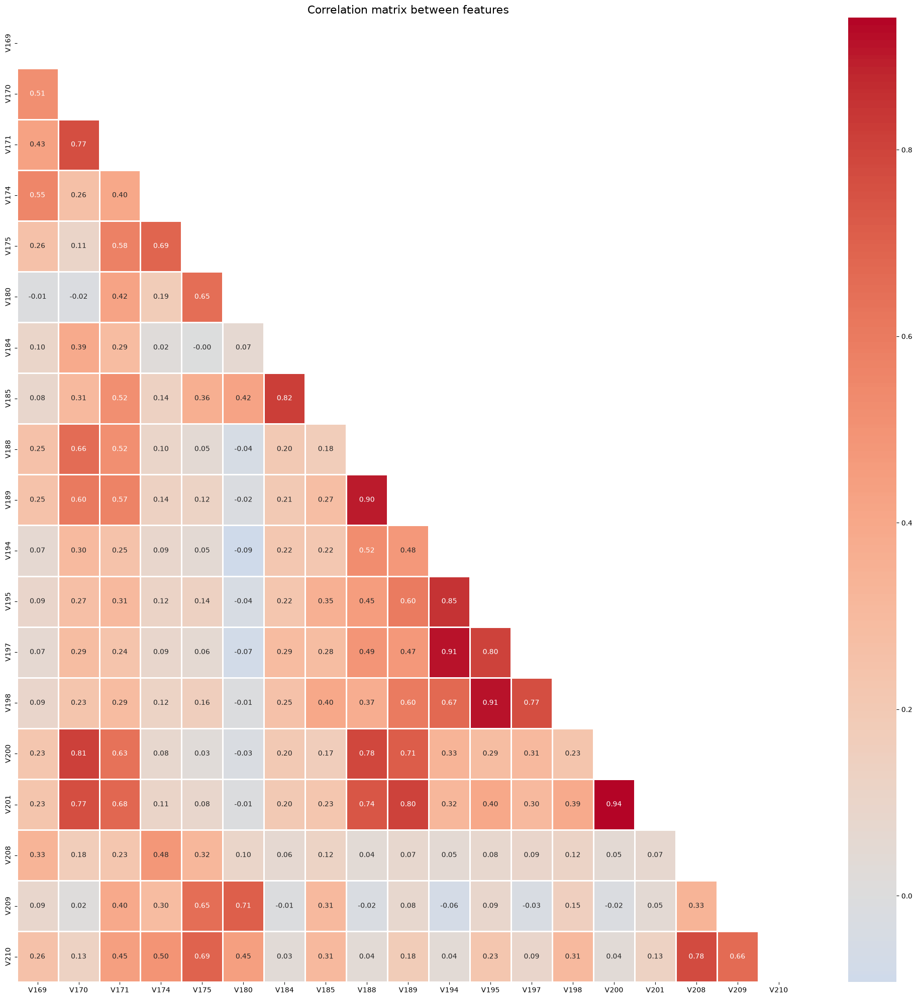

110580

In [22]:
display(df_trans[nans_groups[450721]].describe())
make_hist(df_trans, nans_groups[450721])
make_heatmap(df_trans, nans_groups[450721])

gc.collect()

#### V217~V278

,V217,V218,V219,V223,V224,V225,V226,V228,V229,V230,V231,V232,V233,V235,V236,V237,V240,V241,V242,V243,V244,V253,V254,V257,V258,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V273,V274,V275,V276,V277,V278
count,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000,130430.000000
mean,1.054619,1.725784,1.367132,0.093153,0.394748,0.191758,0.247612,1.351928,1.638710,1.465476,0.765506,1.005597,0.908388,0.184106,0.307667,0.253500,1.000997,1.000238,1.113463,1.178387,1.118562,1.162164,1.075113,1.250993,1.343510,0.964425,1.107161,1.013279,117.390678,201.657623,153.520538,9.167838,36.525101,18.813406,5.997508,73.825554,107.151634,88.899940,31.797276,51.956646,42.328228
std,9.547354,13.919876,12.044032,0.402232,3.443310,1.290820,2.756449,1.409722,4.316026,2.122783,8.877118,10.460254,10.149884,0.902639,2.152332,1.716634,0.049522,0.022663,0.660110,1.398953,0.698807,3.612553,1.357550,1.299956,2.015811,0.379828,1.323231,0.625455,1294.851562,2284.827393,1605.512329,208.038864,644.878601,311.280182,207.317535,935.187927,1258.734131,1072.883179,615.659729,732.145386,660.611816
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,33.593498,20.897525,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,303.000000,400.000000,378.000000,16.000000,144.000000,51.000000,242.000000,54.000000,176.000000,65.000000,293.000000,337.000000,332.000000,23.000000,45.000000,39.000000,7.000000,5.000000,20.000000,57.000000,22.000000,163.000000,60.000000,48.000000,66.000000,8.000000,49.000000,20.000000,153600.000000,153600.000000,153600.000000,55125.000000,55125.000000,55125.000000,55125.000000,51200.000000,66000.000000,51200.000000,104060.000000,104060.000000,104060.000000


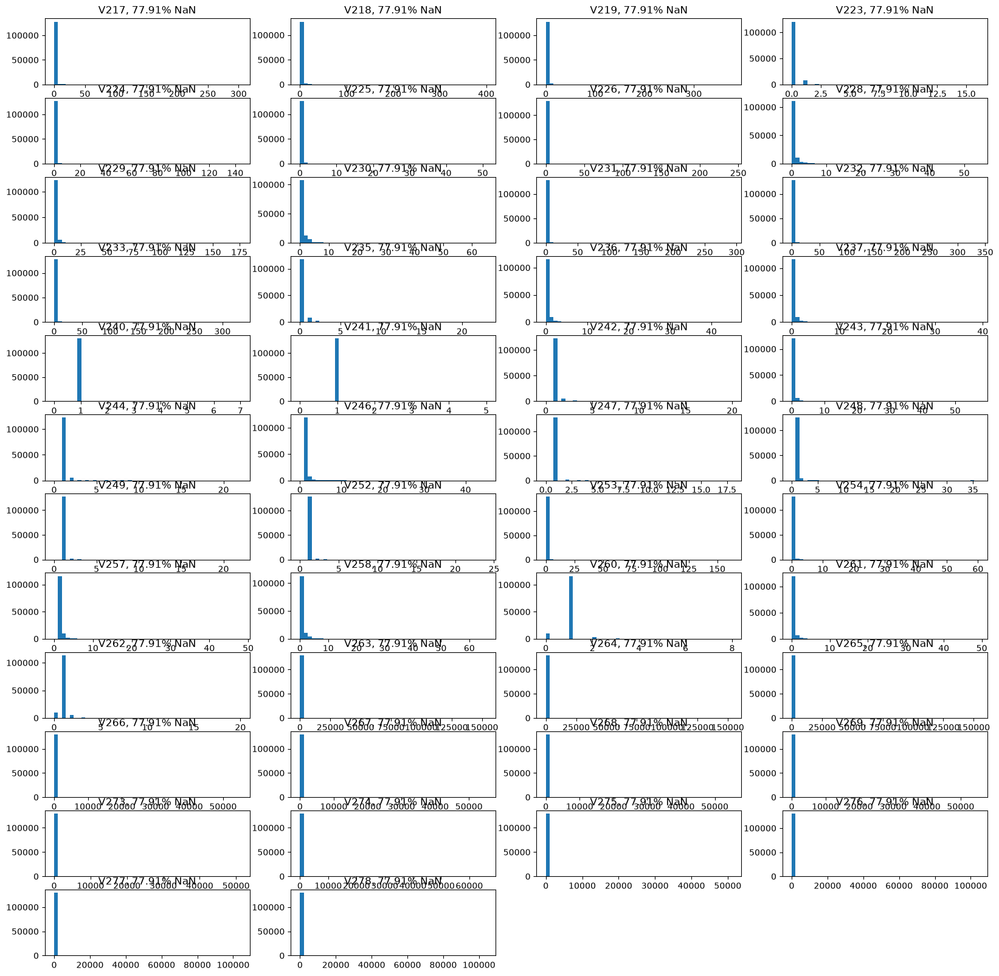

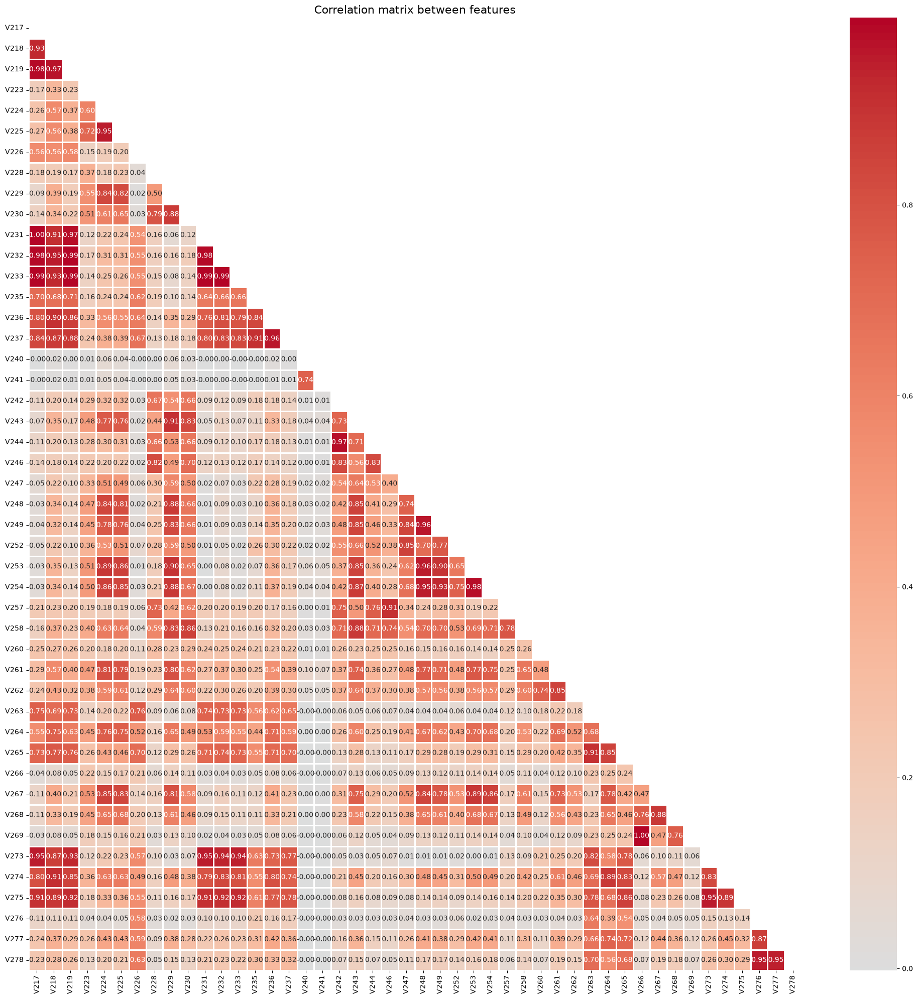

64000

In [23]:
display(df_trans[nans_groups[460110]].describe())
make_hist(df_trans, nans_groups[460110])
make_heatmap(df_trans, nans_groups[460110])

gc.collect()

#### V220~V272

,V220,V221,V222,V227,V234,V238,V239,V245,V250,V251,V255,V256,V259,V270,V271,V272
count,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000,141416.000000
mean,0.169472,1.274912,1.359005,0.147975,2.092847,0.127956,0.136965,0.876619,0.788588,0.794231,0.806656,0.814950,0.967833,7.712763,9.445132,8.464571
std,1.002463,2.728792,2.913772,2.049363,11.323035,0.574657,0.616260,1.821065,0.488386,0.501240,0.939124,0.969953,2.113447,65.507233,74.147720,69.723740
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
max,25.000000,384.000000,384.000000,360.000000,121.000000,23.000000,23.000000,262.000000,18.000000,18.000000,87.000000,87.000000,285.000000,4000.000000,4000.000000,4000.000000


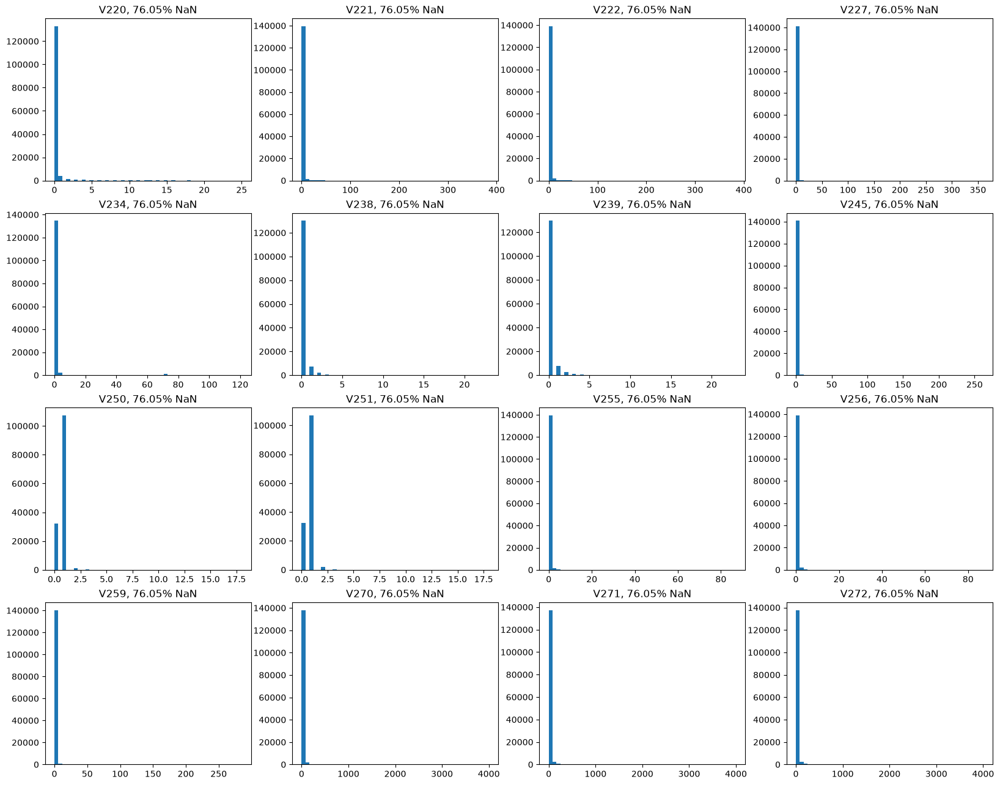

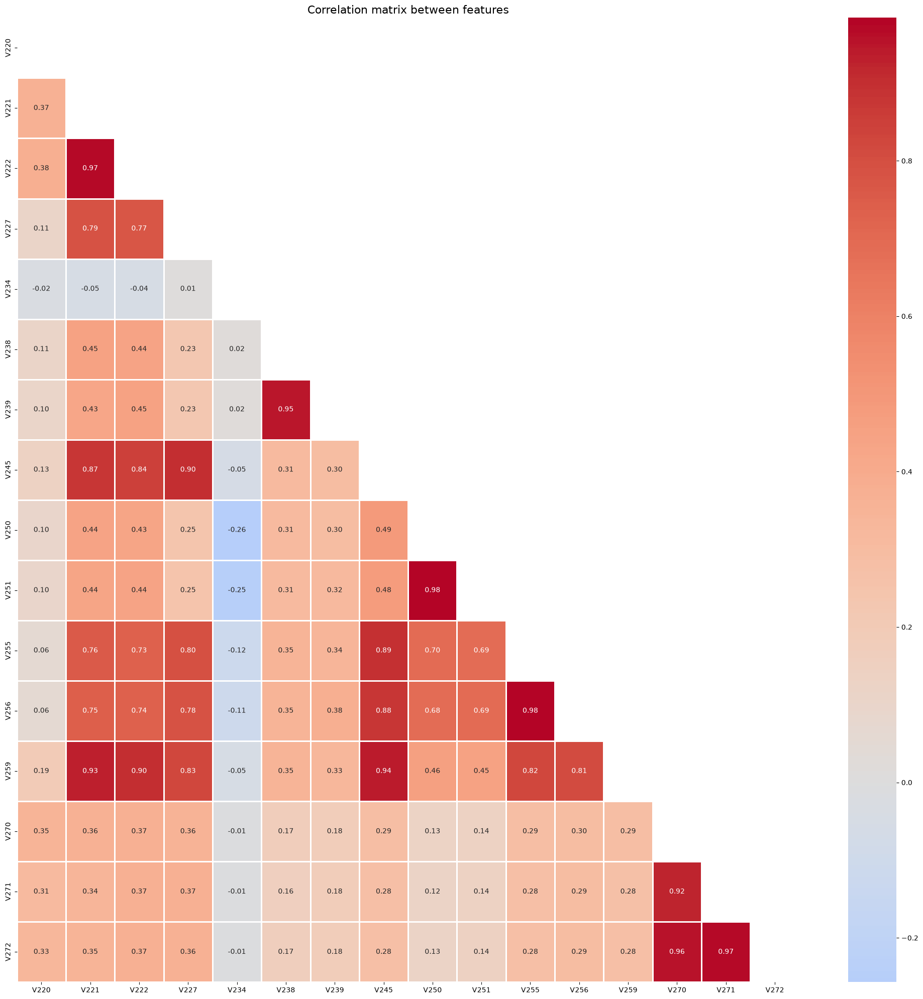

96278

In [24]:
display(df_trans[nans_groups[449124]].describe())
make_hist(df_trans, nans_groups[449124])
make_heatmap(df_trans, nans_groups[449124])

gc.collect()

#### V279~V321

,V279,V280,V284,V285,V286,V287,V290,V291,V292,V293,V294,V295,V297,V298,V299,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V316,V317,V318,V319,V320,V321
count,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000,590528.000000
mean,1.123061,1.967082,0.088543,1.167660,0.031492,0.358579,1.103011,1.659811,1.239916,0.942599,2.313863,1.433424,0.089034,0.298829,0.171655,0.251761,0.283140,0.264208,1.000007,139.748703,408.682343,230.413162,10.995987,118.195648,4.202175,39.173912,109.818550,247.606750,162.153412,18.372477,42.073135,28.326586
std,21.021952,27.851780,0.338424,3.282454,0.190939,1.078995,0.768897,16.252539,3.775050,20.588816,39.526466,25.962946,0.628352,3.175062,1.724218,0.481889,0.623608,0.528238,0.002603,2348.849609,4391.993164,3021.924316,116.254280,352.983093,102.374939,172.128326,2270.032959,3980.042725,2793.343750,332.304871,473.499298,382.053192
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,151.380680,35.970001,0.000000,107.950005,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,880.000000,975.000000,12.000000,95.000000,8.000000,31.000000,67.000000,1055.000000,323.000000,869.000000,1286.000000,928.000000,12.000000,93.000000,49.000000,16.000000,20.000000,16.000000,2.000000,108800.000000,145765.000000,108800.000000,55125.000000,55125.000000,55125.000000,55125.000000,93736.000000,134021.000000,98476.000000,104060.000000,104060.000000,104060.000000


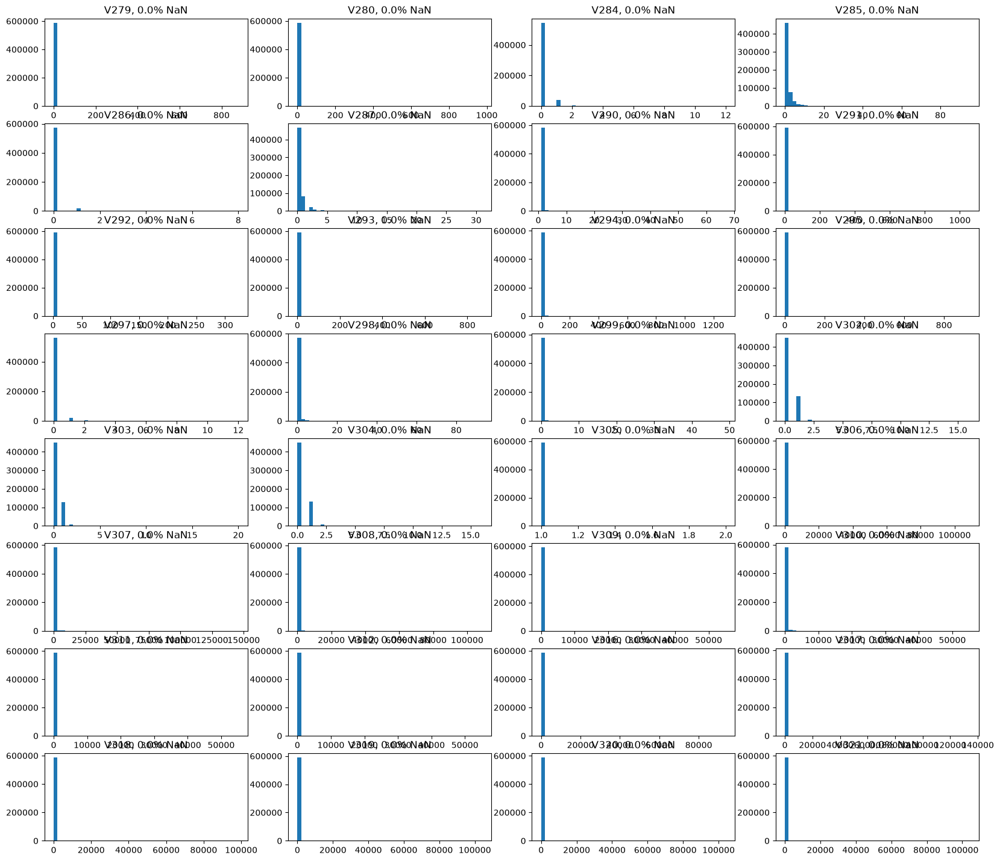

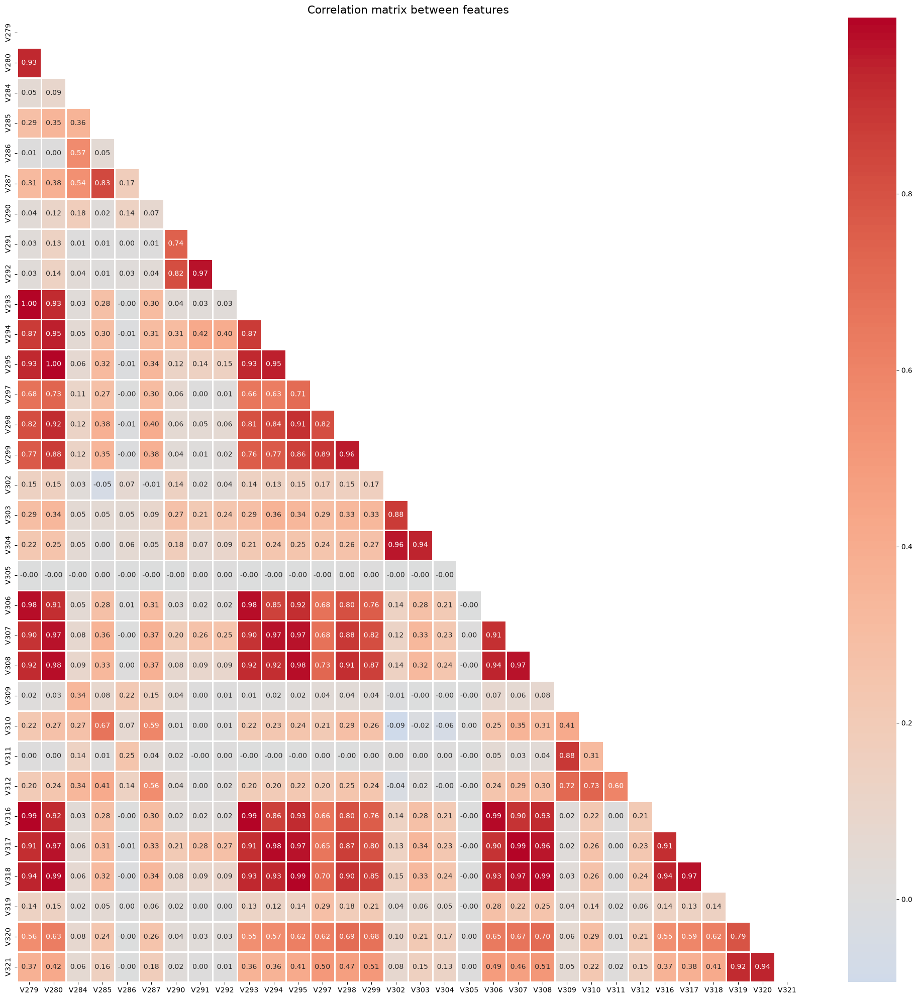

188880

In [25]:
display(df_trans[nans_groups[12]].describe())
make_hist(df_trans, nans_groups[12])
make_heatmap(df_trans, nans_groups[12])

gc.collect()

#### V322-V339

,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000,82351.000000
mean,6.220289,13.103775,9.184612,0.058494,0.851040,0.296633,0.336790,1.312844,0.775874,721.741882,1375.783813,1014.622681,9.807015,59.164551,28.530905,55.352417,151.160538,100.700882
std,56.022560,106.739815,73.627892,0.304415,3.950295,1.364356,1.580145,8.769084,4.727971,6217.223633,11169.275391,7955.735352,243.861404,387.629486,274.576904,668.486816,1095.034302,814.946655
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,880.000000,1411.000000,976.000000,12.000000,44.000000,18.000000,15.000000,99.000000,55.000000,160000.000000,160000.000000,160000.000000,55125.000000,55125.000000,55125.000000,104060.000000,104060.000000,104060.000000


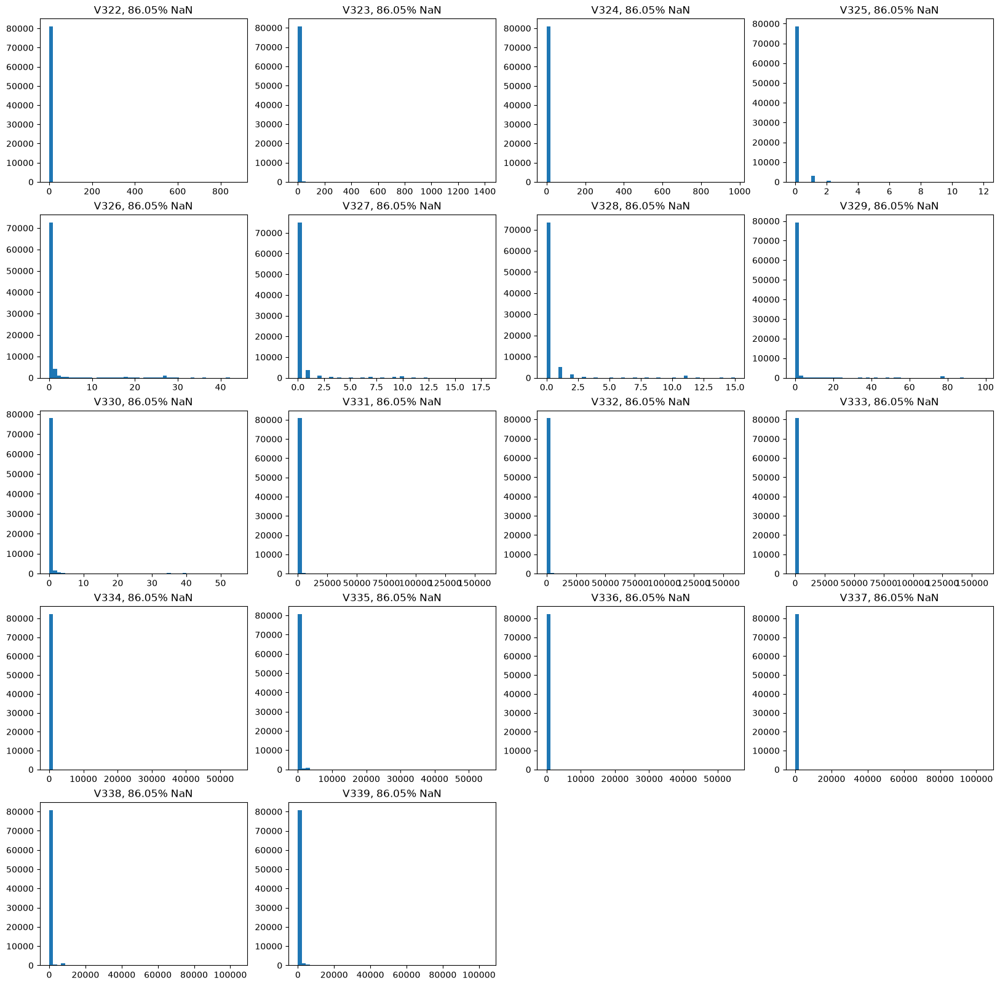

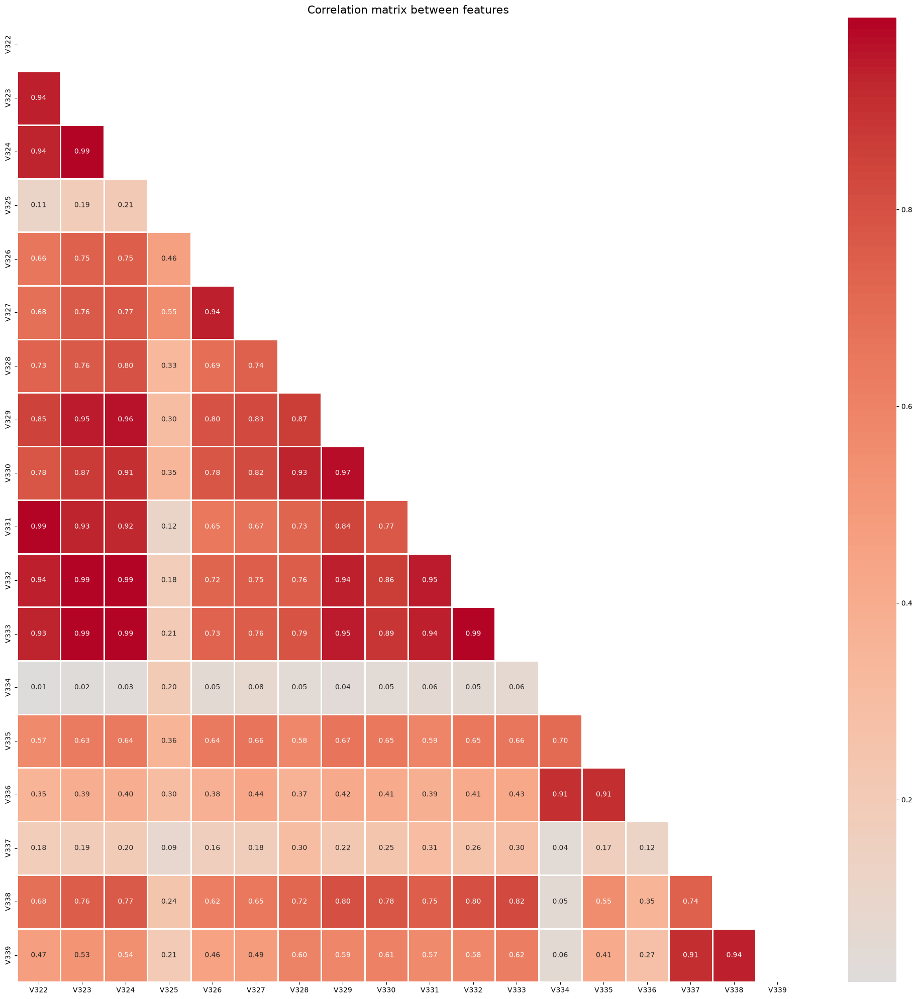

108335

In [26]:
display(df_trans[nans_groups[508189]].describe())
make_hist(df_trans, nans_groups[508189])
make_heatmap(df_trans, nans_groups[508189])

gc.collect()

In [31]:
import json

with open("nans.json", "w", encoding="utf-8") as f:
    json.dump({int(k): v for k, v in nans_groups.items()}, f, ensure_ascii=False)